In [1]:
#import spikeinterface modules
import spikeinterface as si
import spikeinterface.extractors as se
import spikeinterface.toolkit as st
import spikeinterface.sorters as ss
import spikeinterface.comparison as sc
import spikeinterface.widgets as sw
import numpy as np
from numpy import asarray
import glob
import pickle

#import everything else
import os
import sys
import numpy as np
import neo
import pandas as pd
import scipy

# MCS
import McsPy
import McsPy.McsData
import McsPy.McsCMOS
from McsPy import ureg, Q_

# Plotting
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
import seaborn as sns

#SK Learn
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

#networkx
import plotly.graph_objects as go
import networkx as nx
import matplotlib.patches as mpatches

from time import strftime
%matplotlib inline



## Notebook from Spiketrains --> Bursts via ISI Detection

In [2]:
working_directory =r"D:\Files_Reutlingen_Jenny\19-04-16\190416_paper\new_analysis_02_HCx_GFP_B_hCSF_convolved"

output_directory = r"D:\Files_Reutlingen_Jenny\19-04-16\190416_paper\new_analysis_02_HCx_GFP_B_hCSF_convolved"

In [3]:
os.chdir(working_directory)

In [4]:
filename= '02_HCx_GFP_B_hCSF'

In [5]:
#load the main recording dic
MAIN_RECORDING_DICTIONARY = pickle.load(open(os.path.join(output_directory+'\\MAIN_RECORDING_Dictionary_'+filename+'.pkl'), "rb"))

### ab hier weiter

In [6]:
MAIN_RECORDING_DICTIONARY.keys()

dict_keys(['spikedic_MAD', 'network_bursts_seconds', 'fr_dic', 'isi_dictionary', 'isi_average_dic', 'Infos_Recording', 'Infos_Analysis', 'Infos_Anatomy'])

In [7]:
spikedic_MAD = MAIN_RECORDING_DICTIONARY['spikedic_MAD']


In [8]:
MAIN_RECORDING_DICTIONARY['Infos_Recording'].keys()

tick = MAIN_RECORDING_DICTIONARY['Infos_Recording']['tick']
timelengthrecording_s = MAIN_RECORDING_DICTIONARY['Infos_Recording']['timelengthrecording_s']
scale_factor_for_second = MAIN_RECORDING_DICTIONARY['Infos_Recording']['scale_factor_for_second']
scale_factor_for_milisecond = scale_factor_for_second/1000

#### Definition of all Functions for the Interspike Interval Method


In [9]:
def create_bins(lower_bound, width, quantity):
    """ create_bins returns an equal-width (distance) partitioning. 
        It returns an ascending list of tuples, representing the intervals.
        A tuple bins[i], i.e. (bins[i][0], bins[i][1])  with i > 0 
        and i < quantity, satisfies the following conditions:
            (1) bins[i][0] + width == bins[i][1]
            (2) bins[i-1][0] + width == bins[i][0] and
                bins[i-1][1] + width == bins[i][1]
    """
    

    bins = []
    for low in range(lower_bound, 
                     lower_bound + quantity*width + 1, width):
        bins.append((low, low+width))
    return bins


def find_bin(value, bins):
    """ bins is a list of tuples, like [(0,20), (20, 40), (40, 60)],
        binning returns the smallest index i of bins so that
        bin[i][0] <= value < bin[i][1]
    """
    
    for i in range(0, len(bins)):
        if bins[i][0] <= value < bins[i][1]:
            return i
    return -1



def find_binned_spikes(data, bins):
    '''
    Parameters
    ----------
    data : for network spike binning --> expects an 1D array with all spikes detected for the network
    bins : list of tuples of expected bins

    Returns
    -------
    binlist : list of lists where lists contain all spikes for the respective bins

    '''
    binlist =[]
    binspike =[]
    for i in range(0, len(bins)):
        binspike = []
        for a in data:    
            if bins[i][0] <= a < bins[i][1]:
                binspike.append(a)
        binlist.append(binspike)
            
    return binlist




def get_isi_singlechannel(spikedic, tick):
    '''
    Parameters
    ----------
    spikedic : dictionary with all detected spikes for a channel
        DESCRIPTION.

    Returns
    -------
    isidic : keys = channels, values = List of tuples where tuple[0]=detected spike and tuple[1]=isi to the next detected spike
    isi_alone_dic : keys = channels, values = list of isi alone in microseconds!
    CAVE returns are in microseconds
    '''
    
    isidic ={}     
    isilist = []
    isi_alone_dic = {}
    isislist =[]

    for key in spikedic:
        isilist = []
        isislist = []
        if len(spikedic[key])>=2:
            for i in range(0, (len(spikedic[key])-1)):
                isi = spikedic[key][i]*tick, (spikedic[key][i+1]-spikedic[key][i])*tick #CL tick für beide dazu
                isi_alone = (spikedic[key][i+1]-spikedic[key][i])*tick
                isilist.append(isi)
                isislist.append(isi_alone)
        isidic[key]=isilist
        isi_alone_dic[key]=isislist
        
    return isidic, isi_alone_dic



def bin_isi(isi_alone_dic, binsize, binmax=bool, binmaxnumber=None):
    '''

    Parameters
    ----------
    isi_alone_dic : dic
        dictionary with all ISI for every channel
    binsize: int
        expects int in microseconds that defines bin-width
    Returns
    -------
    histo_ISI_dic:
        dic with key:channellabel, value: list with bincounts per bin

    '''
    isi_bins = []
    isi_bins_list = []
    isi_bin_count = []
    histo_ISI_dic = {}
    for key in isi_alone_dic:
        if binmax==True:
            isi_bin_count=[]
            isibins=create_bins(0, binsize, binmaxnumber)
            isi_bins_list=[] 
            for i in range(0, len(isibins)):
                isi_bins=[]
                for a in isi_alone_dic[key]:
                    if isibins[i][0] <= a < isibins[i][1]:
                        isi_bins.append(a)
                isi_bins_list.append(isi_bins)
            for i in range(0, (len(isi_bins_list)-1)):
                isi_bin_count.append(len(isi_bins_list[i]))
            histo_ISI_dic[key]=isi_bin_count
        #else:
            # noch schreiben für variable maximalnummer an bins
            
    return histo_ISI_dic


def bin_lnisi(isi_alone_dic, start_in_microseconds, stop_in_microseconds, totalbins, binmax):
    '''

    Parameters
    ----------
    isi_alone_dic : dic
        dictionary with all ISI for every channel 
    binsize: int
        expects int in microseconds that defines bin-width
    Returns
    -------
    histo_ISI_dic:
        dic with key:channellabel, value: list with bincounts per logarithmic spaced bins

    '''
    isi_bins = []
    isi_bins_list = []
    isi_bin_count = []
    histo_ln_ISI_dic = {}
    for key in isi_alone_dic:
        if binmax==True:
            isi_bin_count=[]
            isibins=create_ln_bins(start_in_microseconds, stop_in_microseconds, totalbins)
            isi_bins_list=[] 
            for i in range(0, len(isibins)):
                isi_bins=[]
                for a in isi_alone_dic[key]:
                    if isibins[i][0] <= a < isibins[i][1]:
                        isi_bins.append(a)
                isi_bins_list.append(isi_bins)
            for i in range(0, (len(isi_bins_list)-1)):
                isi_bin_count.append(len(isi_bins_list[i]))
            histo_ln_ISI_dic[key]=isi_bin_count
        #else:
            # noch schreiben für variable maximalnummer an bins
            
    return histo_ln_ISI_dic, isibins


def get_allchannel_ISI_bins(histo_ISI_dic):
    '''
    Parameters
    ----------
    histo_ISI_dic : dic mit den einzelnen ISI für jeden Channel. Cave, die Values müssen alle die gleiche
                    Länge haben, sonst funktioniert die zip Funktion nicht.
        DESCRIPTION.

    Returns
    -------
    network_ISI_binned = array of all ISI of the whole network binned

    '''
    network_ISI = []
    for key in histo_ISI_dic:
        list1 = histo_ISI_dic[key]
        if len(list1)>len(network_ISI):
            network_ISI=list1
        else:
            list2 = network_ISI
            network_ISI = [a + b for a, b in zip(list1, list2)]
    return np.array(network_ISI)


def get_burst_threshold(df_with_CMA):
    '''
    

    Parameters
    ----------
    df_with_CMA : TYPE
        DESCRIPTION.

    Returns
    -------
    CMAalpha : TYPE
        DESCRIPTION.
    CMAalpha2 : TYPE
        DESCRIPTION.
    maxCMA : TYPE
        DESCRIPTION.
    alpha1 : TYPE
        DESCRIPTION.
    alpha2 : TYPE
        DESCRIPTION.

    '''
    
    networkburstthreshold_ISI = 200000 #wie im paper maximal bei 200 ms als isi
    skewness = scipy.stats.skew(network_ISI)
    if skewness < 1:
        alpha1 = 1
        alpha2 = 0.5
    elif skewness >= 1 and skewness <4:
        alpha1 = 0.7
        alpha2 = 0.3
    elif skewness >=4 and skewness <9:
        alpha1 = 0.5
        alpha2 = 0.3
    elif skewness >=9:
        alpha1 = 0.3
        alpha2 = 0.1
    maxCMA = max(df_with_CMA['CMA'])
    CMAalpha = maxCMA*alpha1
    CMAalpha2 = maxCMA*alpha2
    return CMAalpha, CMAalpha2, maxCMA, alpha1, alpha2


def ISI_threshold_min(df_with_CMA, CMAalpha, CMAalpha2, binsize_in_micros):
    '''
    '''
    indexfactor = df[df['CMA']>CMAalpha].index[-1] + 1
    indexfactor2 = df[df['CMA']>CMAalpha2].index[-1] + 1
    threshold_intraburst = float(indexfactor*binsize_in_micros)
    threshold_burst_related = float(indexfactor2*binsize_in_micros)
    
    return threshold_intraburst, threshold_burst_related


def find_burst_starts(isi_alone, threshold_intraburst, spikedic):
    '''
    Parameters
    ----------
    isi_alone : TYPE
        DESCRIPTION.
    threshold_intraburst : TYPE
        DESCRIPTION.
    spikedic : TYPE
        DESCRIPTION.

    Returns
    -------
    None.

    '''
    burststartdic = {}
    noburstlist = []
    #burststartlist = []
    for key in isi_alone:
        #print(key)
        if len(isi_alone[key])<3:
            noburstlist.append(isi_alone[key])
        burststartlist=[]
        counter = 0
        while counter < (len(isi_alone[key])-4):
            setter = 0
            if isi_alone[key][counter]<threshold_intraburst:
                setter +=1
                if isi_alone[key][counter+setter] < threshold_intraburst:
                    setter +=1
                    if isi_alone[key][counter+setter] < threshold_intraburst:
                        burststartlist.append((spikedic[key][counter])*tick) #CL: zusätzlich times tick to get all timestamps in ms
                        setter += 1
                        while isi_alone[key][counter+setter]<threshold_intraburst and (counter+setter)< (len(isi_alone[key])-4):
                            setter +=1
                            #print('burst '+str(setter))
                        setter +=1
                    else:
                        counter +=1
                else:
                    counter +=1
                counter = counter + setter + 1
            else:
                counter +=1
            #print(str(key) + str(counter))
        burststartdic[key]=burststartlist
        
    return burststartdic   


def find_burst_starts_and_length(isi_alone, threshold_intraburst, spikedic):
    '''
    Parameters
    ----------
    isi_alone : dict
        k = channellabel, values = interspike intervals in microseconds
    threshold_intraburst : float
        the calculated threshold for a single channel burst in microseconds
    spikedic : dict
        k = channellabel, values = spiketimes in ticks
        

    Returns
    -------
    burststart_end_dic : dict
        k = channellabel, values = tuple(a,b) with a = start of a burst x, b= end of burst x 
        with all times in microseconds

    '''
    burststartdic = {}
    noburstlist = []
    #burststartlist = []
    for key in isi_alone:
        #print(key)
        if len(isi_alone[key])<3:
            noburstlist.append(isi_alone[key])
        burststartlist=[]
        counter = 0
        while counter < (len(isi_alone[key])-4):
            setter = 0
            if isi_alone[key][counter]<threshold_intraburst:
                setter +=1
                if isi_alone[key][counter+setter] < threshold_intraburst:
                    setter +=1
                    if isi_alone[key][counter+setter] < threshold_intraburst:
                        burststart_spike = spikedic[key][counter]*tick
                        burstend_spike = spikedic[key][counter+setter]*tick
                        #burststartlist.append((spikedic[key][counter])*tick) #CL: zusätzlich times tick to get all timestamps in µs
                        setter += 1
                        while isi_alone[key][counter+setter]<threshold_intraburst and (counter+setter)< (len(isi_alone[key])-4):
                            setter +=1
                            burstend_spike = spikedic[key][counter+setter]*tick
                            #print('burst '+str(setter))
                        burststartlist.append((burststart_spike, burstend_spike))
                        setter +=1
                    else:
                        counter +=1
                else:
                    counter +=1
                counter = counter + setter + 1
            else:
                counter +=1
            #print(str(key) + str(counter))
        burststartdic[key]=burststartlist
        
    return burststartdic   






In [10]:
def find_burst_starts_and_length(isi_alone, threshold_intraburst, spikedic):
    '''
    Parameters
    ----------
    isi_alone : dict
        k = channellabel, values = interspike intervals in microseconds
    threshold_intraburst : float
        the calculated threshold for a single channel burst in microseconds
    spikedic : dict
        k = channellabel, values = spiketimes in ticks
        

    Returns
    -------
    burststart_end_dic : dict
        k = channellabel, values = tuple(a,b) with a = start of a burst x, b= end of burst x 
        with all times in microseconds

    '''
    burststartdic = {}
    noburstlist = []
    #burststartlist = []
    for key in isi_alone:
        #print(key)
        if len(isi_alone[key])<3:
            noburstlist.append(isi_alone[key])
        burststartlist=[]
        counter = 0
        while counter < (len(isi_alone[key])-3):
            setter = 0
            if isi_alone[key][counter]<threshold_intraburst:
                setter +=1
                if isi_alone[key][counter+setter] < threshold_intraburst:
                    setter +=1
                    if isi_alone[key][counter+setter] < threshold_intraburst:
                        setter += 1
                        burststart_spike = spikedic[key][counter]*tick
                        burstend_spike = spikedic[key][counter+setter]*tick
                        #burststartlist.append((spikedic[key][counter])*tick) #CL: zusätzlich times tick to get all timestamps in µs
                        
                        while isi_alone[key][counter+setter]<threshold_intraburst and (counter+setter)< (len(isi_alone[key])-3):
                            setter +=1
                            burstend_spike = spikedic[key][counter+setter]*tick
                            
                            #print('burst '+str(setter))
                        burststartlist.append((burststart_spike, burstend_spike))
                        #setter +=1
                        counter = counter + setter
                    else:
                        counter +=1
                else:
                    counter +=1
                
            else:
                counter +=1
            #print(str(key) + str(counter))
        burststartdic[key]=burststartlist
        
    return burststartdic   

### ISI Burst Detection

In [11]:
# we st_channel is the dictionary with all spikes per channel
st_channel = spikedic_MAD

In [12]:
binsize_for_ISI = 5000 #in microseconds

In [13]:
isidic, isi_alone = get_isi_singlechannel(st_channel, tick) #creates two dictionaries
histo_ISI_dic=bin_isi(isi_alone, binsize=binsize_for_ISI, 
                      binmax=True, binmaxnumber=200) # dictionary für jeden channel mit 300x 10ms bins (binsize) und der Menge an ISI für die jeweilige Länge
network_ISI=get_allchannel_ISI_bins(histo_ISI_dic) #gibt ein array mit bins entsprechend der bins aus der Vorfunktion


In [14]:
colors = ['green', 'blue', 'orange', 'purple']

<AxesSubplot:title={'center':'Histogram of ISI-bins 10ms whole network'}>

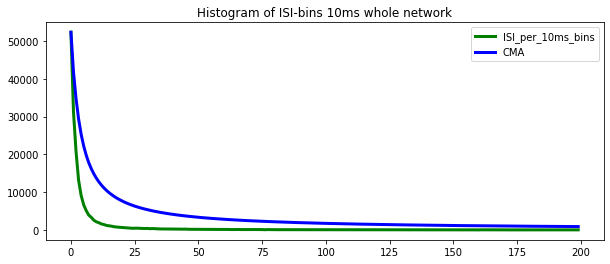

In [15]:
df= pd.DataFrame({'ISI_per_10ms_bins':network_ISI}) #aus Network_ISI wird ein pdDF um die weiteren Schritte durchführen zu können
df["CMA"] = df.ISI_per_10ms_bins.expanding().mean()
df[['ISI_per_10ms_bins', 'CMA']].plot(color=colors, linewidth=3, 
                                      figsize=(10,4), 
                                      title="Histogram of ISI-bins 10ms whole network")

In [16]:
# next calculation of the adaptive thresholds:
CMAalpha, CMAalpha2, maxCMA, alpha1, alpha2=get_burst_threshold(df) # threshold calculation
threshold_intraburst, threshold_burst_related = ISI_threshold_min(df, CMAalpha, 
                                                                  CMAalpha2, binsize_for_ISI) #set thresholds

In [17]:
CMAalpha, CMAalpha2, maxCMA, alpha1, alpha2

(26139.0, 15683.4, 52278.0, 0.5, 0.3)

10ms: (544.5, 181.5, 1815.0, 0.3, 0.1)


5ms: (357.3, 119.10000000000001, 1191.0, 0.3, 0.1)

1ms: (112.89999999999999, 37.63333333333333, 376.3333333333333, 0.3, 0.1)

0.5ms (61.08, 20.36, 203.6, 0.3, 0.1)

0.1ms (51.5, 30.9, 103.0, 0.5, 0.3)

In [18]:
threshold_intraburst, threshold_burst_related

(20000.0, 45000.0)

10ms threshold_intraburst 50000, 230000

5ms threshold_intraburst: 35000 , related 145000

1ms intraburst: 20000, related: 80.000

0.5ms intraburst 35.000, related: 145.000

Single channel bursts were calculated using an adapted version of the Network-CMA method proposed by Välkki and colleagues (Välkki et al. 2017): In brief, interspike-intervals (ISI) of each recording were binned in 5ms bins and a cumulative moving-average over the resulting histogram was calculated. The maximum value of the CMA (maximal CMA) was then used to calculate the maximal ISI between at spikes of one channel: Depending on the skewness of the histogram, the maximal CMA was modified with a cofactor alpha to identify the threshold for intraburst ISI (0.3 < alpha < 1 ) and burst-related ISI (0.1 < alpha < 0.5). Since we were interested in spatial networks, we decided to define single-channel bursts as a sequence of at least 3 consecutive spikes with an ISI below the calculated burst related ISI. To improve comparability between recordings, we defined a range from 60 - 140 ms as reasonable values for burst-related ISI. Thus, we hope to use the best of both worlds for single channel burst detection: Leveraging the adaptability of the Network-CMA method while ensuring comparability between variably-active slices. 


In [19]:
final_threshold = 0

if threshold_burst_related > 140000:
    final_threshold = 140000
elif threshold_burst_related < 60000:
    final_threshold = 60000
else:
    final_threshold = threshold_burst_related

In [20]:
print('The final threshold for this recoding is: {}'.format(final_threshold))
    


The final threshold for this recoding is: 60000


In [21]:
MAIN_RECORDING_DICTIONARY.keys()

dict_keys(['spikedic_MAD', 'network_bursts_seconds', 'fr_dic', 'isi_dictionary', 'isi_average_dic', 'Infos_Recording', 'Infos_Analysis', 'Infos_Anatomy'])

In [22]:
# add the final threshold to the 
Infos_Analysis = MAIN_RECORDING_DICTIONARY['Infos_Analysis']
Infos_Analysis['isi_burst_threshold_base'] = final_threshold

MAIN_RECORDING_DICTIONARY['Infos_Analysis'] = Infos_Analysis

In [25]:
burststart_end_dic = find_burst_starts_and_length(isi_alone, final_threshold, st_channel) 

In [26]:
burststart_end_dic['R12'][-1]

(692653800, 692705800)

In [27]:
1797754320*scale_factor_for_second

1797.75432

In [28]:
MAIN_RECORDING_DICTIONARY['Bursts'] = burststart_end_dic

with open(os.path.join(output_directory+'\\MAIN_RECORDING_Dictionary_'+filename+'.pkl'), 'wb') as f:
    pickle.dump(MAIN_RECORDING_DICTIONARY, f)

In [29]:
MAIN_RECORDING_DICTIONARY = pickle.load(open(os.path.join(output_directory+'\\MAIN_RECORDING_Dictionary_'+filename+'.pkl'), "rb"))

In [30]:
output_directory

'D:\\Files_Reutlingen_Jenny\\19-04-16\\190416_paper\\new_analysis_02_HCx_GFP_B_hCSF_convolved'

In [32]:
st_neurons = st_channel

key = 'R12'

burststarts_array = []
burstend_array = []
for i in range(0, len(burststart_end_dic[key])):
    start = burststart_end_dic[key][i][0]*scale_factor_for_second
    end = burststart_end_dic[key][i][1]*scale_factor_for_second
    burststarts_array.append(start)
    burstend_array.append(end)

array = np.array(st_neurons[key]).flatten()*40*scale_factor_for_second
#burststarts = np.array(burststartdic[key]).flatten()*scale_factor_for_second

#if len(array) > 20:
if len(burststarts_array) > 20:
    fig = plt.figure(figsize=(10, 4))
    ax = fig.add_subplot(1, 1, 1)
    ax.eventplot(burststarts_array, linelengths = 1, linewidth = 1, color='#F27F1B')
    ax.eventplot(burstend_array, linelengths = 0.75, linewidth = 1, color='#04B2D9')
    ax.eventplot(array, linelengths= 0.5, linewidth = 0.3, color='#260B01')
    #ax.eventplot(trigger_on_seconds, linelengths=0.75, color='blue')
    ax.set_xlabel('Time (s)', fontsize=16)
    ax.set_title(' Channel / Unit '+str(key) +' Burststarts')
    ax.set_xlim(0, timelengthrecording_s)
    #ax.set_ylabel('Channel % - Eventplot with burststarts' %str(key))
    #ax.set_ylabel('Channel '+str(key) +' Burststarts')


    plt.show()
    #fig.savefig(str(filename) +'_burstplot_'+str(key)+'.png')
    #plt.close()

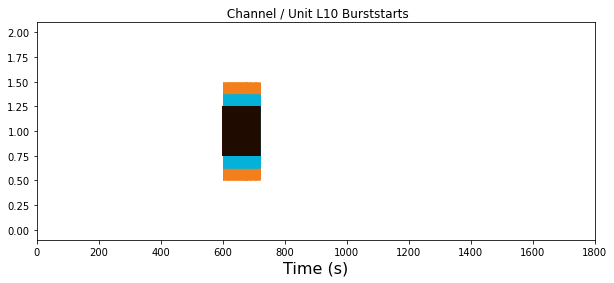

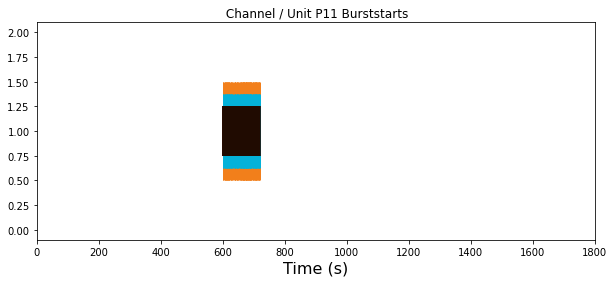

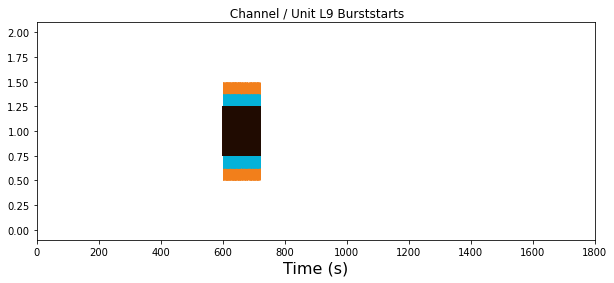

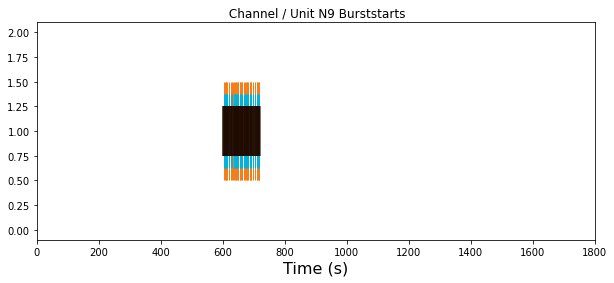

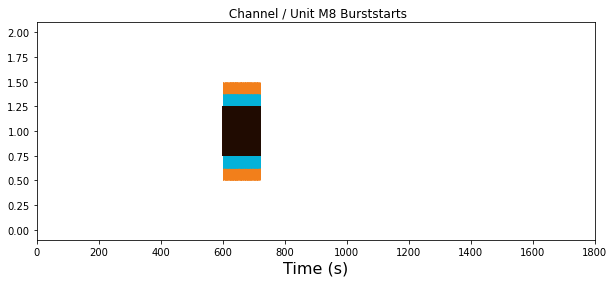

...

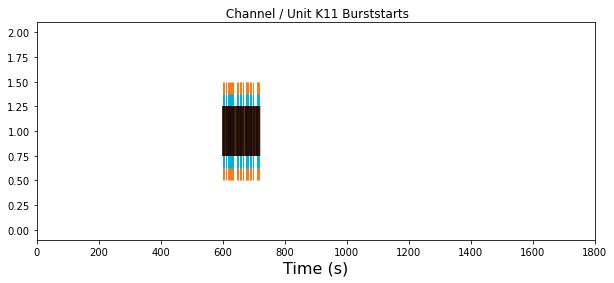

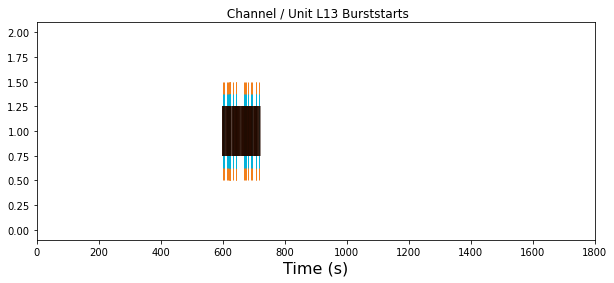

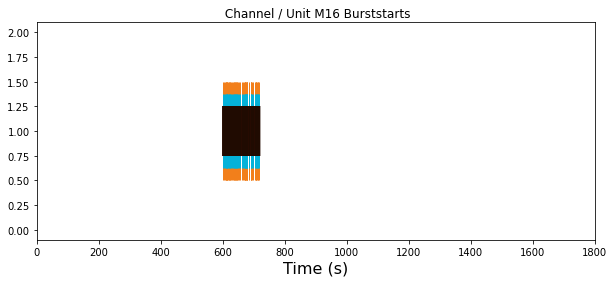

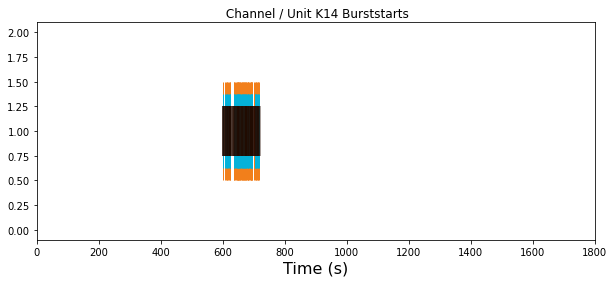

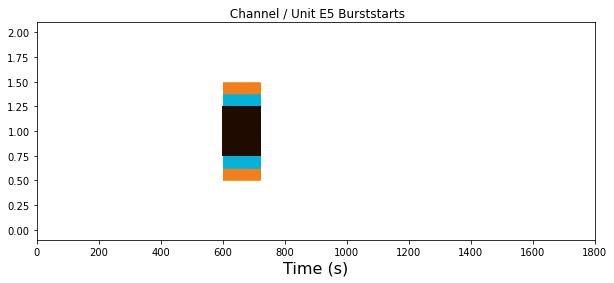

In [33]:
st_neurons = st_channel
for key in burststart_end_dic:
    burststarts_array = []
    burstend_array = []
    for i in range(0, len(burststart_end_dic[key])):
        start = burststart_end_dic[key][i][0]*scale_factor_for_second
        end = burststart_end_dic[key][i][1]*scale_factor_for_second
        burststarts_array.append(start)
        burstend_array.append(end)

    array = np.array(st_neurons[key]).flatten()*40*scale_factor_for_second
    #burststarts = np.array(burststartdic[key]).flatten()*scale_factor_for_second
    
    #if len(array) > 20:
    if len(burststarts_array) > 20:
        fig = plt.figure(figsize=(10, 4))
        ax = fig.add_subplot(1, 1, 1)
        ax.eventplot(burststarts_array, linelengths = 1, linewidth = 1, color='#F27F1B')
        ax.eventplot(burstend_array, linelengths = 0.75, linewidth = 1, color='#04B2D9')
        ax.eventplot(array, linelengths= 0.5, linewidth = 0.3, color='#260B01')
        #ax.eventplot(trigger_on_seconds, linelengths=0.75, color='blue')
        ax.set_xlabel('Time (s)', fontsize=16)
        ax.set_title(' Channel / Unit '+str(key) +' Burststarts')
        ax.set_xlim(0, timelengthrecording_s)
        #ax.set_ylabel('Channel % - Eventplot with burststarts' %str(key))
        #ax.set_ylabel('Channel '+str(key) +' Burststarts')


        plt.show()
        #fig.savefig(str(filename) +'_burstplot_'+str(key)+'.png')
        #plt.close()

In [34]:
def extract_burststarts(burststartenddic):

    burststart_dic = {}
    burstlist = []
    
    for key in burststartenddic:
        burstlist = []
        start_ends = burststartenddic[key]
        for i in start_ends:
            burstlist.append(i[0])
        burststart_dic[key] = burstlist
        
    return burststart_dic

In [35]:
# extract all burststarts for the spade analysis

burststart_dic = extract_burststarts(burststart_end_dic)

In [36]:
burststart_dic

{'R12': [602530640, 609706920, 668988480, 675943040, 692653800],
 'L10': [600425480,
  601563960,
  602639400,
  603790920,
  604981680,
  606762720,
  608064720,
  610036920,
  611116040,
  612687720,
  613040760,
  613887600,
  614496760,
  616112080,
  617250920,
  617406840,
  618413400,
  619798200,
  621715360,
  624037840,
  624816320,
  625555840,
  627696880,
  627827840,
  628440000,
  629749880,
  630719200,
  631431160,
  632526560,
  633636680,
  635118000,
  636907280,
  638139480,
  639661240,
  640499080,
  641066200,
  642427000,
  643888760,
  644804840,
  646479840,
  647877680,
  648170880,
  648315680,
  649217000,
  650600400,
  652480840,
  653666480,
  654661440,
  656216160,
  656858080,
  659292400,
  659637080,
  661082000,
  662037720,
  663551360,
  666065440,
  666851000,
  668270400,
  668984120,
  669698320,
  671072360,
  672593960,
  672741040,
  672922080,
  673905240,
  674731600,
  675287600,
  676348920,
  677558120,
  678093240,
  679084080,
  679

In [37]:
np.save(filename+'_burst_starts_dictionary.npy', burststart_dic)

In [38]:
burststart_dic = np.load(filename+'_burst_starts_dictionary.npy', allow_pickle = True).item()

In [39]:
def subdivide_spiketrain(spiketrain, sub_start = 0, sub_stop = 10, tick=40, scale_factor_for_second=1e-06):
    '''
    Excpects: 
        a spiketrain with tick datapoints
        default ticks are 40
        default scale_factor_for_seconds = 1e-06
        provide the start and stop of the desired sub in seconds
    
    Does:
        converts the desired seconds into data ticks
        checks if the spikes of the given spiketrain is in the desired subs
        substracts the starting time -->
        
    Returns:
        a spiketrain dictionary that again starts from zero
    
    '''
    sub_start_tick = sub_start / (tick*scale_factor_for_second)
    sub_stop_tick = sub_stop / (tick*scale_factor_for_second)
    sub_spiketrain = {}
  
    for key in spiketrain: 
        list_per_key = []
        for i in spiketrain[key]:
            if (i>=sub_start_tick ) & (i<sub_stop_tick):
                list_per_key.append(int(i-sub_start_tick))
        sub_spiketrain[key]=list_per_key

    return sub_spiketrain

In [40]:
 # create an array of the spikes in scale of seconds
active_channels = 0
spikedic_seconds = {}
for key in burststart_dic:
    relevant_factor = timelengthrecording_s*0.05
    if len(burststart_dic[key])>relevant_factor:
        sec_array = np.asarray(burststart_dic[key])*tick*scale_factor_for_second
        spikedic_seconds[key]=sec_array
        active_channels += 1
spikearray_seconds = np.asarray(list(spikedic_seconds.values())) 

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


In [41]:
divided_burststart_dic = subdivide_spiketrain(burststart_dic, sub_start=0, sub_stop=3000)



In [42]:
burststart_dic

{'R12': [602530640, 609706920, 668988480, 675943040, 692653800],
 'L10': [600425480,
  601563960,
  602639400,
  603790920,
  604981680,
  606762720,
  608064720,
  610036920,
  611116040,
  612687720,
  613040760,
  613887600,
  614496760,
  616112080,
  617250920,
  617406840,
  618413400,
  619798200,
  621715360,
  624037840,
  624816320,
  625555840,
  627696880,
  627827840,
  628440000,
  629749880,
  630719200,
  631431160,
  632526560,
  633636680,
  635118000,
  636907280,
  638139480,
  639661240,
  640499080,
  641066200,
  642427000,
  643888760,
  644804840,
  646479840,
  647877680,
  648170880,
  648315680,
  649217000,
  650600400,
  652480840,
  653666480,
  654661440,
  656216160,
  656858080,
  659292400,
  659637080,
  661082000,
  662037720,
  663551360,
  666065440,
  666851000,
  668270400,
  668984120,
  669698320,
  671072360,
  672593960,
  672741040,
  672922080,
  673905240,
  674731600,
  675287600,
  676348920,
  677558120,
  678093240,
  679084080,
  679

In [43]:
def get_interburst_intervals(burststart_end_dic):
    
    '''
    parameters:
    
    burststart_end_dic : dic
    keys = channellabels
    values = list of tuples tuple (a, b) with a = burststarts, b = burstends in µs
    
    
    ______________________
    
    returns:
    
    ibi_dic : dic
    keys = channellabels
    values = list of all interburstintervals in µs
    
    
    ______________________
    
    nota bene:
    
    interburst intervals are defined as non-bursting intervals between bursts.
    That means it is from burst-end1 to burststart2.
    
    '''
    
    
    ibi_dic = {}
    ibi_list = []
    
    for key in burststart_end_dic:
        ibi_list = []
        bursts = burststart_end_dic[key]
        for i in range(0, len(bursts)-1): # we leave the last burst out
            burst_end = bursts[i][1]
            next_start = bursts[i+1][0]
            
            interburst_interval = next_start - burst_end
            
            ibi_list.append(interburst_interval)
        
        ibi_dic[key] = ibi_list
        
    return ibi_dic
            

In [44]:
burst_ibi_dic = get_interburst_intervals(burststart_end_dic)

In [45]:
MAIN_RECORDING_DICTIONARY['Interburst-Intervals'] = burst_ibi_dic

In [46]:
burststart_end_dic

{'R12': [(602530640, 602579240),
  (609706920, 609812800),
  (668988480, 669025440),
  (675943040, 676030600),
  (692653800, 692705800)],
 'L10': [(600425480, 600620760),
  (601563960, 601787360),
  (602639400, 602817480),
  (603790920, 603878880),
  (604981680, 605240680),
  (606762720, 606906960),
  (608064720, 608213520),
  (610036920, 610079520),
  (611116040, 611507360),
  (612687720, 612829320),
  (613040760, 613198040),
  (613887600, 614006320),
  (614496760, 614748040),
  (616112080, 616139440),
  (617250920, 617345240),
  (617406840, 617615400),
  (618413400, 618666680),
  (619798200, 620041960),
  (621715360, 621943560),
  (624037840, 624157520),
  (624816320, 625070600),
  (625555840, 625658760),
  (627696880, 627754640),
  (627827840, 628006600),
  (628440000, 628606800),
  (629749880, 630023160),
  (630719200, 630829600),
  (631431160, 631623680),
  (632526560, 632653400),
  (633636680, 633777400),
  (635118000, 635525200),
  (636907280, 637023640),
  (638139480, 638335440

In [47]:
1209110480*scale_factor_for_second

1209.11048

In [48]:
burststart_end_dic

{'R12': [(602530640, 602579240),
  (609706920, 609812800),
  (668988480, 669025440),
  (675943040, 676030600),
  (692653800, 692705800)],
 'L10': [(600425480, 600620760),
  (601563960, 601787360),
  (602639400, 602817480),
  (603790920, 603878880),
  (604981680, 605240680),
  (606762720, 606906960),
  (608064720, 608213520),
  (610036920, 610079520),
  (611116040, 611507360),
  (612687720, 612829320),
  (613040760, 613198040),
  (613887600, 614006320),
  (614496760, 614748040),
  (616112080, 616139440),
  (617250920, 617345240),
  (617406840, 617615400),
  (618413400, 618666680),
  (619798200, 620041960),
  (621715360, 621943560),
  (624037840, 624157520),
  (624816320, 625070600),
  (625555840, 625658760),
  (627696880, 627754640),
  (627827840, 628006600),
  (628440000, 628606800),
  (629749880, 630023160),
  (630719200, 630829600),
  (631431160, 631623680),
  (632526560, 632653400),
  (633636680, 633777400),
  (635118000, 635525200),
  (636907280, 637023640),
  (638139480, 638335440

In [49]:
# for every unit, the whole time of bursts is calculated and put into a dictionary
bursting_time_per_unit_dic = {}
for key in burststart_end_dic:
    time = 0
    for i in burststart_end_dic[key]:
        bursttime = i[1] - i[0]
        time = time + bursttime
    bursting_time_per_unit_dic[key] = time*scale_factor_for_second # kein tick, vorher bereits drin

In [50]:
# for every unit, the whole time of bursts is calculated and put into a dictionary
bursts_per_unit_dic = {}
for key in burststart_end_dic:
    number_of_bursts = 0
    for i in burststart_end_dic[key]:
        number_of_bursts += 1
    bursts_per_unit_dic[key] = number_of_bursts

In [51]:
MAIN_RECORDING_DICTIONARY['bursting_time_per_channel'] = bursting_time_per_unit_dic
MAIN_RECORDING_DICTIONARY['bursts_per_channel'] = bursts_per_unit_dic


In [52]:
mean_number_bursts = np.mean(list(bursts_per_unit_dic.values()))

In [53]:
mean_time_bursts = np.mean(list(bursting_time_per_unit_dic.values()))

In [54]:
std_number_bursts = np.std(list(bursts_per_unit_dic.values()))

In [55]:
mean_burst_per_second = mean_number_bursts/timelengthrecording_s

In [56]:
len(bursts_per_unit_dic.values())

252

In [57]:
1209148440*scale_factor_for_second

1209.14844

In [58]:
# this function takes the dictionary with every burst start and stop and returns a dictionary
# where every unit is a key and the values are tuples consisting of keys of connected units (i.e., bursting together)
# and the number of shared bursts


burst_connections_dic = {}


for key in burststart_end_dic:
    other_keys = list(burststart_end_dic.keys())
    other_keys.remove(key)
    connected_unit_list = []
    for j in other_keys:
        number_of_bursts = 0
        time_shared = 0
        for i in burststart_end_dic[key]:
            start, end = i[0], i[1]
            for m in burststart_end_dic[j]:
                other_start = m[0]
                other_end = m[1]
                if (other_start > start) & (other_start < end):
                    if other_end >= end:
                        time_shared = time_shared + (end - other_start)
                    else:
                        time_shared = time_shared + (other_end - other_start)
                    number_of_bursts += 1
                    
        if number_of_bursts > 0:
            connected_unit_list.append((j, number_of_bursts, time_shared*scale_factor_for_second))        
    burst_connections_dic[key] = connected_unit_list

In [59]:
MAIN_RECORDING_DICTIONARY['burst_connections'] = burst_connections_dic

In [60]:
np.save(filename+'_whole_recording_burst_connections_dic.npy', burst_connections_dic)

In [61]:
burst_connections_dic = np.load(filename+'_whole_recording_burst_connections_dic.npy', allow_pickle = True).item()

In [62]:
MAIN_RECORDING_DICTIONARY['Infos_Analysis']


{'relevant_factor': 90.0, 'isi_burst_threshold_base': 60000}

In [66]:
simple_burst_connection = {}

for key in burst_connections_dic:
    listed_connections = []
    for i in burst_connections_dic[key]:
        if i[1] > timelengthrecording_s*0.1: # Länge des Recordings * mindestens 0.1Hz -> alle zehn Sekunden
        #if i[2] > 3: # Länge der gesharedten bursts in sec
        #if (i[1] > 10) & (i[2] > 1): # Länge der gesharedten bursts in sec
            listed_connections.append(i[0])
    simple_burst_connection[key] = listed_connections

In [67]:
simple_burst_connection

{'R12': [],
 'L10': ['P11',
  'L9',
  'N9',
  'M8',
  'O6',
  'N7',
  'K6',
  'I6',
  'G4',
  'H5',
  'F3',
  'O14',
  'R13',
  'L11',
  'O11',
  'P12',
  'M9',
  'N10',
  'L8',
  'O7',
  'N8',
  'K7',
  'L7',
  'L6',
  'L3',
  'I5',
  'H6',
  'G3',
  'H4',
  'K10',
  'O16',
  'R14',
  'O12',
  'P13',
  'M10',
  'N11',
  'K8',
  'M6',
  'O1',
  'K5',
  'H3',
  'H7',
  'E4',
  'F5',
  'O13',
  'O9',
  'K9',
  'M7',
  'R7',
  'M4',
  'H2',
  'I7',
  'G5',
  'F4',
  'I9',
  'P16',
  'H8',
  'A5',
  'F7',
  'C7',
  'B6',
  'F8',
  'D8',
  'E9',
  'D10',
  'H10',
  'I11',
  'H12',
  'G7',
  'G6',
  'D4',
  'C3',
  'A4',
  'F6',
  'C6',
  'B5',
  'E8',
  'D7',
  'F9',
  'D9',
  'G10',
  'F10',
  'H11',
  'I10',
  'H13',
  'G12',
  'C2',
  'D3',
  'A3',
  'A2',
  'C5',
  'B4',
  'E7',
  'D6',
  'B8',
  'C9',
  'G9',
  'O15',
  'H9',
  'M15',
  'B3',
  'B2',
  'D5',
  'C4',
  'A6',
  'E6',
  'C8',
  'B7',
  'G8',
  'E10',
  'D11',
  'N15',
  'G11',
  'M14',
  'K11',
  'M16',
  'K14',
  'E5'],


In [68]:
# Reutlingen
all_channels = ['D1', 'E1', 'F1', 'G1', 'H1', 'I1', 'I2', 'K1', 'K2', 'L1', 'L2', 'L3', 'M1', 'M2', 
                        'M3', 'M4', 'N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'O1', 'O2', 'O3', 'O4', 'O5', 'O6', 
                        'O7', 'P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'P9', 'R2', 'R3', 'R4', 'R5', 
                        'R6', 'R7', 'R8', 'R9', 'R10', 'R11', 'R12', 'R13', 'R14', 'R15', 'B1', 'B2', 'C1', 'C2', 'D2', 'E2', 'F2', 'G2', 'G3', 'H2', 'H3', 'I3', 'K3', 'K4', 
                         'L4', 'L5', 'M5', 'M6', 'M7', 'N7', 'N8', 'O8', 'O9', 'O10', 'O11', 'P10', 'P11', 
                         'P12', 'P13', 'P14', 'P15', 'P16', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'A10', 'A11', 'B3', 'B4', 'B5', 'B6', 
                         'B7', 'B8', 'B9', 'B10', 'B11', 'B12', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 
                          'C11', 'C12', 'C13', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 
                         'D13', 'D14', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'E13', 'E14', 
                         'E15', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'F13', 'F14', 'F15', 
                         'F16', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12', 'G13', 'G14', 'G15', 'G16', 
                         'H4', 'H5', 'H6', 'H7', 'H8', 'H9', 'H10', 'H11', 'H12', 'H13', 'H14', 'H15', 'H16', 'I4', 
                         'I5', 'I6', 'I7', 'I8', 'I9', 'I10', 'I11', 'I12', 'I13', 'I14', 'I15', 'I16', 'K5', 'K6', 
                         'K7', 'K8', 'K9', 'K10', 'K11', 'K12', 'K13', 'K14', 'K15', 'K16', 'L6', 'L7', 'L8', 'L9', 
                         'L10', 'L11', 'L12', 'L13', 'L14', 'L15', 'L16', 'M8', 'M9', 'M10', 'M11', 'M12', 'M13', 
                         'M14', 'M15', 'M16', 'N9', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'O12', 'O13', 
                         'O14', 'O15', 'O16', 'A12', 'A13', 'A14', 'A15', 'B13', 'B14', 'B15', 'B16', 'C14', 'C15', 'C16', 'D15', 'D16', 'E16']

In [ ]:
# Aachen
all_channels = ['D1', 'E1', 'F1', 'G1', 'H1', 'J1', 'J2', 'K1', 'K2', 'L1', 'L2', 'L3', 'M1', 'M2', 
                        'M3', 'M4', 'N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'O1', 'O2', 'O3', 'O4', 'O5', 'O6', 
                        'O7', 'P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'P9', 'R2', 'R3', 'R4', 'R5', 
                        'R6', 'R7', 'R8', 'R9', 'R10', 'R11', 'R12', 'R13', 'R14', 'R15', 'B1', 'B2', 'C1', 'C2', 'D2', 'E2', 'F2', 'G2', 'G3', 'H2', 'H3', 'J3', 'K3', 'K4', 
                         'L4', 'L5', 'M5', 'M6', 'M7', 'N7', 'N8', 'O8', 'O9', 'O10', 'O11', 'P10', 'P11', 
                         'P12', 'P13', 'P14', 'P15', 'P16', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'A10', 'A11', 'B3', 'B4', 'B5', 'B6', 
                         'B7', 'B8', 'B9', 'B10', 'B11', 'B12', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 
                          'C11', 'C12', 'C13', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 
                         'D13', 'D14', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'E13', 'E14', 
                         'E15', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'F13', 'F14', 'F15', 
                         'F16', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12', 'G13', 'G14', 'G15', 'G16', 
                         'H4', 'H5', 'H6', 'H7', 'H8', 'H9', 'H10', 'H11', 'H12', 'H13', 'H14', 'H15', 'H16', 'J4', 
                         'J5', 'J6', 'J7', 'J8', 'J9', 'J10', 'J11', 'J12', 'J13', 'J14', 'J15', 'J16', 'K5', 'K6', 
                         'K7', 'K8', 'K9', 'K10', 'K11', 'K12', 'K13', 'K14', 'K15', 'K16', 'L6', 'L7', 'L8', 'L9', 
                         'L10', 'L11', 'L12', 'L13', 'L14', 'L15', 'L16', 'M8', 'M9', 'M10', 'M11', 'M12', 'M13', 
                         'M14', 'M15', 'M16', 'N9', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'O12', 'O13', 
                         'O14', 'O15', 'O16', 'A12', 'A13', 'A14', 'A15', 'B13', 'B14', 'B15', 'B16', 'C14', 'C15', 'C16', 'D15', 'D16', 'E16']

In [70]:
#layerdic 16.04.2019 B!!!
layerdic = {'layer1':[], 
            'layer2-3': ['F1', 'G1', 'H1', 'I1', 'K1', 'L1', 'M1', 'N1', 'O1', 'P1', 'H2', 'I2', 'K2', 'L2', 
                         'M2', 'N2', 'O2', 'P2', 'R2', 'K3', 'L3', 'M3', 'N3', 'O3', 'P3', 'R3', 'L4', 'M4', 
                         'N4', 'O4', 'P4', 'R4', 'N5', 'O5', 'P5', 'R5', 'P6', 'R6', 'R7'],
           'layer4':    ['D1', 'E1', 'F2', 'G2', 'G3', 'H3', 'I3', 'I4', 'K4', 'L5', 'M5', 'M6', 'N6', 'O6', 
                         'O7', 'P7', 'P8', 'R8'],
                         
           'layer5-6':  ['B1', 'C1', 'A2', 'B2', 'C2', 'D2', 'E2', 'A3', 'B3', 'C3', 'D3', 'E3', 'F3',
                         'A4', 'B4', 'C4', 'D4', 'E4', 'F4', 'G4', 'H4', 'A5', 'B5', 'C5', 'D5', 'E5', 
                         'F5', 'G5', 'H5', 'I5', 'K5', 'A6', 'B6', 'C6', 'D6', 'E6', 'F6', 'G6', 'H6', 'I6', 
                         'K6', 'L6', 'A7', 'B7', 'C7', 'D7', 'E7', 'F7', 'G7', 'H7', 'I7', 'K7', 'L7', 'M7', 
                         'N7', 'A8', 'B8', 'C8', 'D8', 'E8', 'F8', 'G8', 'H8', 'I8', 'K8', 'L8', 'M8', 
                         'N8', 'O8', 'B9', 'C9', 'D9', 'E9', 'F9', 'G9', 'H9', 'I9', 'K9', 'L9', 'M9', 
                         'N9', 'O9', 'P9', 'R9', 'C10', 'D10', 'E10', 'F10', 'G10', 'H10', 'I10', 'K10', 
                         'L10', 'M10', 'N10', 'O10', 'P10', 'R10', 'D11', 'E11', 'F11', 'G11', 'H11', 
                         'I11', 'K11', 'L11', 'M11', 'N11', 'O11', 'P11', 'R11', 'E12', 'F12', 'G12', 
                         'H12', 'I12', 'K12', 'L12', 'M12', 'N12', 'O12', 'P12', 'R12', 'F13', 'G13', 
                         'H13', 'I13', 'K13', 'L13', 'M13', 'N13', 'O13', 'P13', 'R13', 'G14', 'H14', 
                         'I14', 'K14', 'L14', 'M14', 'N14', 'O14', 'P14', 'R14', 'H15', 'I15', 'K15', 
                         'L15', 'M15', 'N15', 'O15', 'P15', 'R15', 'I16', 'K16', 'L16', 'M16', 
                         'N16', 'O16', 'P16', 'R16'],
           'whitematter':['A9', 'A10', 'B10', 'A11', 'B11', 'C11', 'A12', 'B12', 'C12', 'D12', 'A13', 
                          'B13', 'C13', 'D13', 'E13', 'A14', 'B14', 'C14', 'D14', 'E14', 'F14', 'A15', 
                          'B15', 'C15', 'D15', 'E15', 'F15', 'G15', 'B16', 'C16', 'D16', 'E16', 'F16', 
                          'G16', 'H16']
                         }

In [71]:
MAIN_RECORDING_DICTIONARY['Infos_Anatomy']['layerdic']

{'layer1': [],
 'layer2-3': ['F1',
  'G1',
  'H1',
  'I1',
  'K1',
  'L1',
  'M1',
  'N1',
  'O1',
  'P1',
  'H2',
  'I2',
  'K2',
  'L2',
  'M2',
  'N2',
  'O2',
  'P2',
  'R2',
  'K3',
  'L3',
  'M3',
  'N3',
  'O3',
  'P3',
  'R3',
  'L4',
  'M4',
  'N4',
  'O4',
  'P4',
  'R4',
  'N5',
  'O5',
  'P5',
  'R5',
  'P6',
  'R6',
  'R7'],
 'layer4': ['D1',
  'E1',
  'F2',
  'G2',
  'G3',
  'H3',
  'I3',
  'I4',
  'K4',
  'L5',
  'M5',
  'M6',
  'N6',
  'O6',
  'O7',
  'P7',
  'P8',
  'R8'],
 'layer5-6': ['B1',
  'C1',
  'A2',
  'B2',
  'C2',
  'D2',
  'E2',
  'A3',
  'B3',
  'C3',
  'D3',
  'E3',
  'F3',
  'A4',
  'B4',
  'C4',
  'D4',
  'E4',
  'F4',
  'G4',
  'H4',
  'A5',
  'B5',
  'C5',
  'D5',
  'E5',
  'F5',
  'G5',
  'H5',
  'I5',
  'A6',
  'B6',
  'C6',
  'D6',
  'E6',
  'F6',
  'G6',
  'H6',
  'I6',
  'K6',
  'A7',
  'B7',
  'C7',
  'D7',
  'E7',
  'F7',
  'G7',
  'H7',
  'I7',
  'K7',
  'L7',
  'M7',
  'N7',
  'A8',
  'B8',
  'C8',
  'D8',
  'E8',
  'F8',
  'G8',
  'H8',
  'I8

In [72]:
def invert_layerdic(layer_dic):
    
    '''
    Expects a dictionary with key = layer, value = list of channellabels
    
    Returns a dictionary with key = channellabels, value = layer
    '''
    layerdic_invert = {}

    for key in layerdic:
        for i in layerdic[key]:
            layerdic_invert[i]=key
            
            
    return layerdic_invert

In [73]:
inverted_layerdic = invert_layerdic(layerdic)

In [74]:
inverted_layerdic['K5']

'layer5-6'

In [75]:
layer_colors={'layer1':'#F28749', 'layer2-3':'#B5D932', 'layer4':'#8C3A67', 'layer5-6':'#3F93A6', 'whitematter':'#C9F2EE'}

In [76]:
# this block creates coordinates as on a MEA Grid for each channel
# coordinates are between 0 and 1 via np.linspace

# CAVE: I needs to be exchanged for J for Aachen Data, or i.e. the not MC Rack obtained data
columnlist =['A','B','C','D','E','F','G','H','I','K','L','M','N','O','P','R']
mea_coordinates = np.linspace(0,1,16)
mea_positional_coordinates_dic = {}

for i in all_channels:
    x_num = columnlist.index(i[0])
    x_coord = mea_coordinates[x_num]
    y_num = 17-int(i[1:]) # minus 1 since python starts counting at zero
    y_coord = 1-(mea_coordinates[-y_num])
    mea_positional_coordinates_dic[i] = [x_coord, y_coord]

In [77]:
mea_coordinates

array([0.        , 0.06666667, 0.13333333, 0.2       , 0.26666667,
       0.33333333, 0.4       , 0.46666667, 0.53333333, 0.6       ,
       0.66666667, 0.73333333, 0.8       , 0.86666667, 0.93333333,
       1.        ])

In [78]:
burst_connections_dic

{'R12': [('P11', 2, 0.0736),
  ('N9', 1, 0.03516),
  ('O6', 1, 0.030199999999999998),
  ('N7', 1, 0.00648),
  ('O14', 2, 0.07084),
  ('P12', 1, 0.05116),
  ('N10', 1, 0.01424),
  ('L8', 1, 0.01644),
  ('O7', 1, 0.00356),
  ('L6', 1, 0.019119999999999998),
  ('K10', 1, 0.015799999999999998),
  ('N11', 1, 0.07904),
  ('P14', 1, 0.081),
  ('O13', 2, 0.1108),
  ('K9', 1, 0.01644),
  ('I9', 1, 0.04752),
  ('H8', 1, 0.00228),
  ('F9', 1, 0.047959999999999996),
  ('I10', 1, 0.010159999999999999),
  ('H13', 1, 0.00876),
  ('O15', 1, 0.02668),
  ('H9', 1, 0.012199999999999999),
  ('M13', 1, 0.014079999999999999),
  ('B7', 1, 0.046),
  ('L13', 1, 0.02984),
  ('M16', 1, 0.01492),
  ('K14', 2, 0.03964),
  ('L15', 1, 0.04908)],
 'L10': [('R12', 1, 0.03696),
  ('O10', 8, 0.62532),
  ('P11', 18, 0.99484),
  ('L9', 28, 2.73916),
  ('N9', 13, 0.93124),
  ('M8', 30, 2.5614399999999997),
  ('O6', 23, 1.65212),
  ('N7', 23, 1.79576),
  ('R4', 2, 0.044919999999999995),
  ('M5', 11, 0.49263999999999997),
  

##### Simple Burst Connection

In [79]:
burst_conn_graph = nx.Graph()

In [80]:
for key in simple_burst_connection:
    for i in simple_burst_connection[key]:
        burst_conn_graph.add_edge(key, i)

In [81]:
burst_conn_graph.number_of_nodes(), burst_conn_graph.number_of_edges()

(142, 6530)

In [82]:
G = burst_conn_graph

In [83]:
G.nodes

NodeView(('L10', 'P11', 'L9', 'N9', 'M8', 'O6', 'N7', 'K6', 'I6', 'G4', 'H5', 'F3', 'O14', 'R13', 'L11', 'O11', 'P12', 'M9', 'N10', 'L8', 'O7', 'N8', 'K7', 'L7', 'L6', 'L3', 'I5', 'H6', 'G3', 'H4', 'K10', 'O16', 'R14', 'O12', 'P13', 'M10', 'N11', 'K8', 'M6', 'O1', 'K5', 'H3', 'H7', 'E4', 'F5', 'O13', 'O9', 'K9', 'M7', 'R7', 'M4', 'H2', 'I7', 'G5', 'F4', 'I9', 'P16', 'H8', 'A5', 'F7', 'C7', 'B6', 'F8', 'D8', 'E9', 'D10', 'H10', 'I11', 'H12', 'G7', 'G6', 'D4', 'C3', 'A4', 'F6', 'C6', 'B5', 'E8', 'D7', 'F9', 'D9', 'G10', 'F10', 'H11', 'I10', 'H13', 'G12', 'C2', 'D3', 'A3', 'A2', 'C5', 'B4', 'E7', 'D6', 'B8', 'C9', 'G9', 'O15', 'H9', 'M15', 'B3', 'B2', 'D5', 'C4', 'A6', 'E6', 'C8', 'B7', 'G8', 'E10', 'D11', 'N15', 'G11', 'M14', 'K11', 'M16', 'K14', 'E5', 'N12', 'M5', 'I8', 'N5', 'G2', 'N6', 'M1', 'I4', 'N4', 'N1', 'L5', 'B9', 'N13', 'M12', 'L16', 'P14', 'N16', 'I12', 'F11', 'K2', 'N14', 'L13', 'A8'))

### Complex Burst Graphs



we take for the nodesize the normalized amount of bursting time for each channel

we take for edges the number of shared bursts

In [84]:
bursting_time_per_unit_dic

{'R12': 0.33099999999999996,
 'L10': 17.76988,
 'O10': 1.42224,
 'P11': 8.01604,
 'L9': 16.64896,
 'N9': 4.03352,
 'M8': 15.016079999999999,
 'R8': 0.0,
 'O6': 5.3991999999999996,
 'N7': 6.56424,
 'R4': 0.14404,
 'P5': 0.0,
 'R2': 0.0,
 'M5': 2.76732,
 'K6': 19.12924,
 'I8': 14.83564,
 'L2': 0.07411999999999999,
 'M1': 1.5187199999999998,
 'I4': 1.21844,
 'K3': 0.27232,
 'H1': 0.0,
 'I6': 16.06144,
 'G4': 11.5664,
 'H5': 15.43736,
 'E2': 0.34548,
 'F3': 6.4566799999999995,
 'N13': 8.71584,
 'O14': 16.69428,
 'R13': 12.881079999999999,
 'L11': 1.20252,
 'O11': 16.61272,
 'P12': 19.61228,
 'M9': 31.349999999999998,
 'N10': 24.29448,
 'L8': 16.32328,
 'R9': 0.0,
 'O7': 10.715639999999999,
 'N8': 10.05288,
 'R5': 0.24536,
 'P6': 0.18652,
 'K7': 13.78784,
 'L7': 12.69924,
 'N4': 0.89044,
 'O3': 0.0,
 'N1': 1.07528,
 'L6': 20.61104,
 'L3': 7.366759999999999,
 'M2': 0.0,
 'I5': 10.73636,
 'K4': 0.48228,
 'H6': 14.69592,
 'I1': 0.0,
 'G3': 8.8628,
 'H4': 12.35684,
 'E1': 0.0,
 'F2': 0.0,
 'K13

In [85]:
#normalize the bursting time per unit 
normalized_bursting_time_per_unit_dic = {}
time_list = list(bursting_time_per_unit_dic.values())
maximum = max(time_list)
minimum = min(time_list)

for key in bursting_time_per_unit_dic:
    value = bursting_time_per_unit_dic[key]
    normalized = (value - minimum)/(maximum-minimum)
    normalized_bursting_time_per_unit_dic[key] = normalized

In [86]:
#normalize the number of shared bursts and time
burst_connections_dic

burst_list = list(burst_connections_dic)


maximum_bursts 
minimum_bursts
maximum_time
minimum_time


for key in burst_connections_dic:
    

SyntaxError: unexpected EOF while parsing (<ipython-input-86-3482f254e546>, line 14)

In [ ]:
np.mean(time_list)

In [65]:
nx.get_node_attributes(G, )

TypeError: get_node_attributes() missing 1 required positional argument: 'name'

In [87]:
# add attributes to the Graph Nodes

for i in G.nodes():
    node_key = i
    coordinate = mea_positional_coordinates_dic[node_key]
    G.nodes[node_key]['pos']=coordinate
    G.nodes[node_key]['layer']=inverted_layerdic[i]
    G.nodes[node_key]['color']=layer_colors[inverted_layerdic[i]]
    G.nodes[node_key]['degree_centrality']=nx.degree_centrality(G)[i]
    G.nodes[node_key]['betweenness_centrality']=nx.betweenness_centrality(G, k=10, endpoints = True)[i]
    G.nodes[node_key]['bursting_time_normalized']=normalized_bursting_time_per_unit_dic[i]
    #print(i)

In [88]:
pos = nx.get_node_attributes(G, 'pos')
layer = nx.get_node_attributes(G, 'layer')
color = nx.get_node_attributes(G, 'color')
burst_time = nx.get_node_attributes(G, 'bursting_time_normalized')
centrality = nx.betweenness_centrality(G, k=10, endpoints = True)

<ipython-input-89-43a7f6ac5a48>:50: UserWarning: Legend does not support '#F28749' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-89-43a7f6ac5a48>:50: UserWarning: Legend does not support '#B5D932' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-89-43a7f6ac5a48>:50: UserWarning: Legend does not support '#8C3A67' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-89-43a7

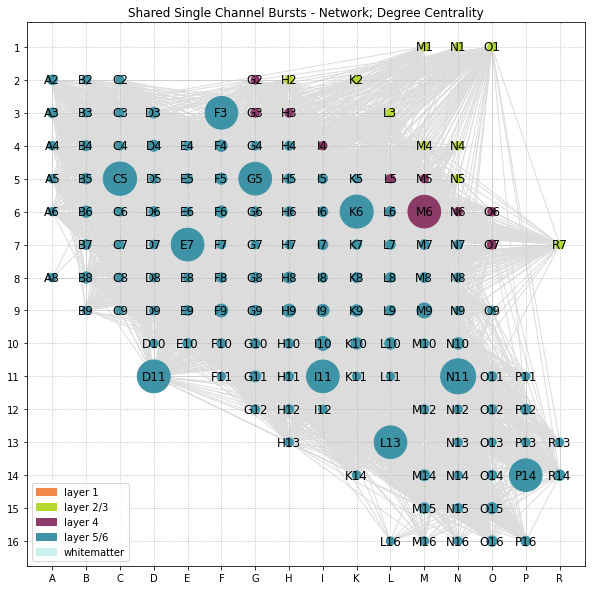

In [89]:
# degree centrality

for i in G.nodes():
    node_key = i
    coordinate = mea_positional_coordinates_dic[node_key]
    G.nodes[node_key]['pos']=coordinate
    G.nodes[node_key]['layer']=inverted_layerdic[i]
    G.nodes[node_key]['color']=layer_colors[inverted_layerdic[i]]
    G.nodes[node_key]['degree_centrality']=nx.degree_centrality(G)[i]
    G.nodes[node_key]['bursting_time_normalized']=normalized_bursting_time_per_unit_dic[i]


pos = nx.get_node_attributes(G, 'pos')
layer = nx.get_node_attributes(G, 'layer')
color = nx.get_node_attributes(G, 'color')
bursting_time_normalized = nx.get_node_attributes(G, 'bursting_time_normalized')

# plot the figures
fig, ax = plt.subplots(1,1, figsize=(10,10))


nodes = G.nodes()
# colors = [mapping[G.nodes[n]['color']] for n in nodes]
node_size = [v * 10000 for v in centrality.values()]
#node_size = [v * 5000 for v in bursting_time_normalized.values()]


nx.draw_networkx(
    G,
    pos,
    node_size=node_size,
    node_color=color.values(),
    edge_color='gainsboro',
    ax=ax
)


ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-0.05, 1.05)
ax.set_xticks(mea_coordinates)
ax.set_yticks(mea_coordinates)
ax.set_xticklabels(columnlist)
ax.set_yticklabels([16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1])
ax.set_title('Shared Single Channel Bursts - Network; Degree Centrality')

ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

ax.grid(ls=':')
#plt.axis("off")
ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
layer1 = mpatches.Patch(color='#F28749', label='layer 1')
layer23 = mpatches.Patch(color='#B5D932', label='layer 2/3')
layer4 = mpatches.Patch(color='#8C3A67', label='layer 4')
layer56 = mpatches.Patch(color='#3F93A6', label='layer 5/6')
wm = mpatches.Patch(color='#C9F2EE', label='whitematter')
plt.legend(handles=[layer1, layer23, layer4, layer56, wm])

#plt.yticks(mea_coordinates, columnlist)
#plt.xticks(list(mea_coordinates), columnlist)
plt.show()

#fig.savefig('190416_'+filename+'_betweenness_centrality_0p1Gz_04102021.png', dpi = 300, bbox_inches='tight', transparent=True)


In [90]:
MAIN_RECORDING_DICTIONARY['GRAPH_shared_bursts'] = G

In [91]:
MAIN_RECORDING_DICTIONARY.keys()

dict_keys(['spikedic_MAD', 'network_bursts_seconds', 'fr_dic', 'isi_dictionary', 'isi_average_dic', 'Infos_Recording', 'Infos_Analysis', 'Infos_Anatomy', 'Bursts', 'Interburst-Intervals', 'bursting_time_per_channel', 'bursts_per_channel', 'burst_connections', 'GRAPH_shared_bursts'])

In [92]:
Basics = {'active_channels': 214,
 'relevant_factor': 90.0,
 'mean_fr_whole_recording': 1262.617}

In [93]:
MAIN_RECORDING_DICTIONARY['Basics'] = Basics

In [94]:
with open(os.path.join(output_directory+'\\MAIN_RECORDING_Dictionary_'+filename+'.pkl'), 'wb') as f:
    pickle.dump(MAIN_RECORDING_DICTIONARY, f)

In [95]:
G.edges()

EdgeView([('L10', 'P11'), ('L10', 'L9'), ('L10', 'N9'), ('L10', 'M8'), ('L10', 'O6'), ('L10', 'N7'), ('L10', 'K6'), ('L10', 'I6'), ('L10', 'G4'), ('L10', 'H5'), ('L10', 'F3'), ('L10', 'O14'), ('L10', 'R13'), ('L10', 'L11'), ('L10', 'O11'), ('L10', 'P12'), ('L10', 'M9'), ('L10', 'N10'), ('L10', 'L8'), ('L10', 'O7'), ('L10', 'N8'), ('L10', 'K7'), ('L10', 'L7'), ('L10', 'L6'), ('L10', 'L3'), ('L10', 'I5'), ('L10', 'H6'), ('L10', 'G3'), ('L10', 'H4'), ('L10', 'K10'), ('L10', 'O16'), ('L10', 'R14'), ('L10', 'O12'), ('L10', 'P13'), ('L10', 'M10'), ('L10', 'N11'), ('L10', 'K8'), ('L10', 'M6'), ('L10', 'O1'), ('L10', 'K5'), ('L10', 'H3'), ('L10', 'H7'), ('L10', 'E4'), ('L10', 'F5'), ('L10', 'O13'), ('L10', 'O9'), ('L10', 'K9'), ('L10', 'M7'), ('L10', 'R7'), ('L10', 'M4'), ('L10', 'H2'), ('L10', 'I7'), ('L10', 'G5'), ('L10', 'F4'), ('L10', 'I9'), ('L10', 'P16'), ('L10', 'H8'), ('L10', 'A5'), ('L10', 'F7'), ('L10', 'C7'), ('L10', 'B6'), ('L10', 'F8'), ('L10', 'D8'), ('L10', 'E9'), ('L10', 'D10')

<IPython.core.display.Javascript object>


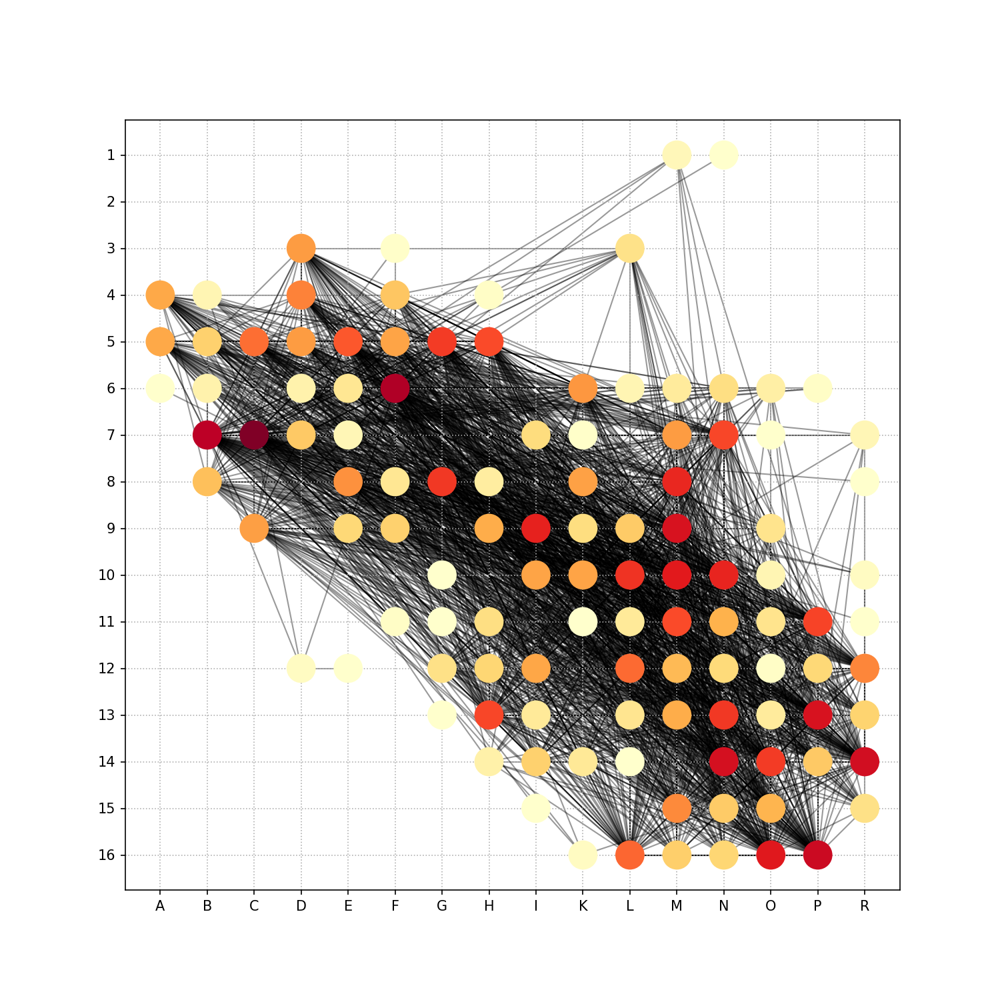

In [211]:
fig, ax = plt.subplots(1,1, figsize=(10,10))

p = nx.degree_centrality(G)

nx.draw_networkx_edges(G, pos, alpha=0.4, ax=ax, cmap='viridis')

nx.draw_networkx_nodes(
    G,
    pos,
    #node_size=([G.nodes[v]['degree_centrality'] for v in G]*10),
    node_size = 400,
    node_color=list(p.values()),
    #edgecolors=
    cmap=plt.cm.YlOrRd,
    #cmap='viridis',

    ax=ax
)


ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-0.05, 1.05)
ax.set_xticks(mea_coordinates)
ax.set_yticks(mea_coordinates)
ax.set_xticklabels(columnlist)
ax.set_yticklabels([16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1])

ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

ax.grid(ls=':')
#plt.axis("off")
#ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
'''
layer1 = mpatches.Patch(color='#F28749', label='layer 1')
layer23 = mpatches.Patch(color='#B5D932', label='layer 2/3')
layer4 = mpatches.Patch(color='#8C3A67', label='layer 4')
layer56 = mpatches.Patch(color='#3F93A6', label='layer 5/6')
wm = mpatches.Patch(color='#C9F2EE', label='whitematter')
plt.legend(handles=[layer1, layer23, layer4, layer56, wm])
'''

plt.show()

#fig.savefig('pseudo_anatomy_burst_graph_directions'+filebase+'_.png', dpi = 300, transparent=True)
#fig.savefig('cortex_div11_aCSF_ID046_30µMNorepinephrine_spont_1_burst_connections_dic_graph.png', dpi=300, bbox_inches='tight')


<IPython.core.display.Javascript object>


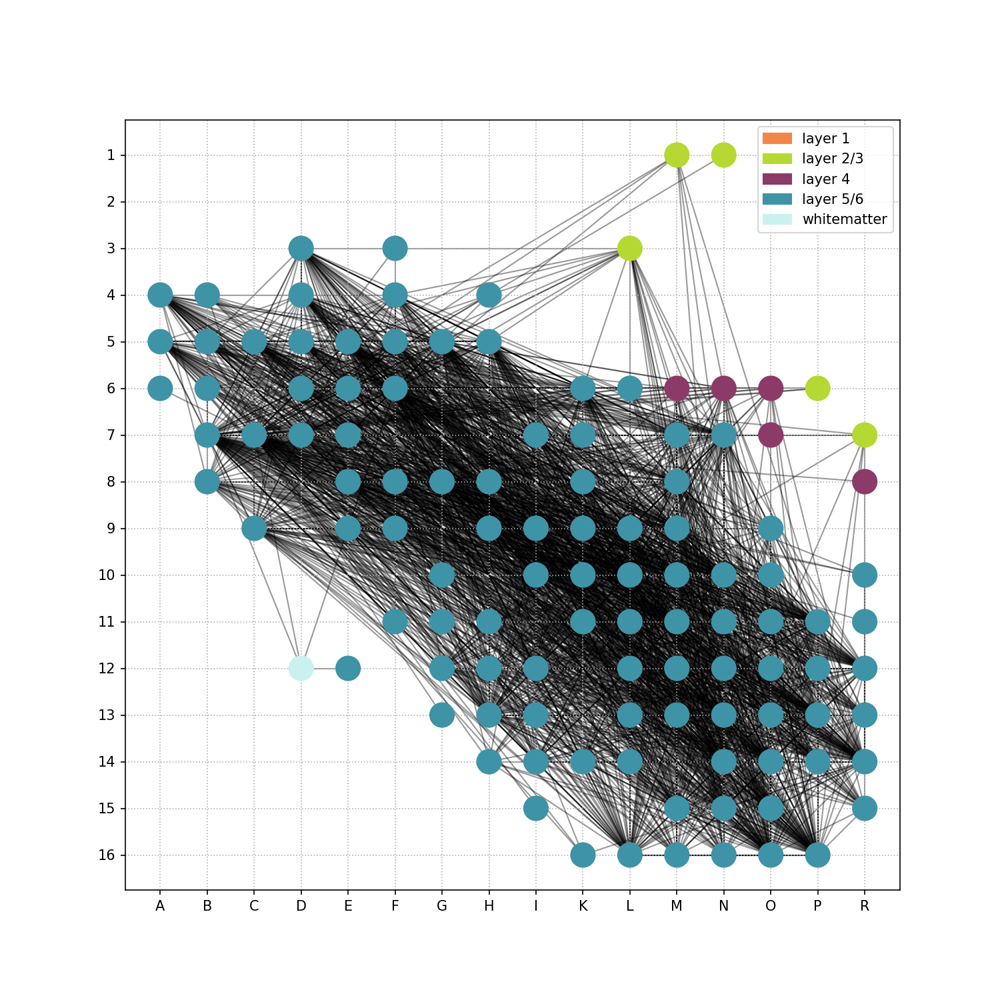

<ipython-input-212-e8e9e8144084>:44: UserWarning: Legend does not support '#F28749' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-212-e8e9e8144084>:44: UserWarning: Legend does not support '#B5D932' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-212-e8e9e8144084>:44: UserWarning: Legend does not support '#8C3A67' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-212-

In [212]:
fig, ax = plt.subplots(1,1, figsize=(10,10))


nx.draw_networkx_edges(
    G,
    pos, 
    alpha=0.4, 
    edge_color='#000000',
    ax=ax,
)


from itertools import count
# get unique groups
groups = set(nx.get_node_attributes(G,'color').values())
mapping = dict(zip(sorted(groups),count()))


nodes = G.nodes()
colors = [mapping[G.nodes[n]['color']] for n in nodes]


nx.draw_networkx_nodes(
    G,
    pos,
    node_size=300,
    node_color=color.values(),
    #cmap='viridis',
    ax=ax
)


ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-0.05, 1.05)
ax.set_xticks(mea_coordinates)
ax.set_yticks(mea_coordinates)
ax.set_xticklabels(columnlist)
ax.set_yticklabels([16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1])

ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

ax.grid(ls=':')
#plt.axis("off")
ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
layer1 = mpatches.Patch(color='#F28749', label='layer 1')
layer23 = mpatches.Patch(color='#B5D932', label='layer 2/3')
layer4 = mpatches.Patch(color='#8C3A67', label='layer 4')
layer56 = mpatches.Patch(color='#3F93A6', label='layer 5/6')
wm = mpatches.Patch(color='#C9F2EE', label='whitematter')
plt.legend(handles=[layer1, layer23, layer4, layer56, wm])

#plt.yticks(mea_coordinates, columnlist)
#plt.xticks(list(mea_coordinates), columnlist)
plt.show()

#fig.savefig('pseudo_anatomy_burst_graph_'+filebase+'_.png', dpi = 300, transparent=True)

### Betweenness Centrality and components.

We can calculate components of the original graph G. This is interesting for larger networks. 

In [213]:
components = nx.connected_components(G)

In [214]:
# find the largest component
largest_component = max(components, key=len)

In [215]:
len(largest_component), len(G.nodes())

(113, 113)

In [216]:
# make a subgraph of the largest component
H = G.subgraph(largest_component)

In [217]:
# calculate the betweenness centrality

centrality = nx.betweenness_centrality(H, k=10, endpoints = True)

In [218]:
centrality

{'R12': 0.01169290412479306,
 'M8': 0.023689822314480736,
 'N7': 0.021249290672660494,
 'N13': 0.022437477908510545,
 'O14': 0.01601870810502649,
 'M9': 0.036465635667057676,
 'N10': 0.02310570566650269,
 'L16': 0.013213231302062972,
 'O16': 0.03030514885624331,
 'P13': 0.027525372061615514,
 'M10': 0.03330240843898083,
 'I9': 0.028799746801236547,
 'P16': 0.04122132392721022,
 'F6': 0.17355196451677937,
 'C5': 0.012235605403783958,
 'N14': 0.028597499339099934,
 'L10': 0.021309905688716047,
 'P11': 0.018589142528795993,
 'L9': 0.00892857142857143,
 'O6': 0.00892857142857143,
 'K6': 0.10898651456621095,
 'H5': 0.013492136206958306,
 'R13': 0.00892857142857143,
 'L11': 0.10803571428571429,
 'O11': 0.00892857142857143,
 'P12': 0.00892857142857143,
 'L6': 0.00892857142857143,
 'I12': 0.009040196971152409,
 'I14': 0.00892857142857143,
 'K10': 0.00918631382975838,
 'R15': 0.00892857142857143,
 'N11': 0.00914606355522623,
 'F5': 0.009599067547128538,
 'P14': 0.008973326172574292,
 'N12': 0.0

In [219]:
# 
lpc = nx.community.label_propagation_communities(H)

In [220]:
# get different community indexes
community_index = {n: i for i, com in enumerate(lpc) for n in com}

In [221]:
# observe them
community_index

{'L14': 0,
 'A5': 0,
 'C9': 0,
 'M15': 0,
 'B5': 0,
 'O10': 0,
 'M8': 0,
 'F11': 0,
 'O14': 0,
 'M10': 0,
 'D5': 0,
 'M11': 0,
 'L11': 0,
 'F5': 0,
 'B8': 0,
 'R11': 0,
 'F3': 0,
 'M9': 0,
 'M1': 0,
 'R10': 0,
 'G8': 0,
 'M6': 0,
 'K9': 0,
 'R7': 0,
 'B7': 0,
 'H13': 0,
 'P16': 0,
 'O7': 0,
 'G5': 0,
 'R15': 0,
 'P11': 0,
 'C7': 0,
 'P6': 0,
 'K10': 0,
 'B6': 0,
 'F4': 0,
 'I12': 0,
 'N15': 0,
 'K8': 0,
 'E7': 0,
 'E12': 0,
 'D3': 0,
 'N14': 0,
 'N10': 0,
 'H12': 0,
 'L16': 0,
 'H14': 0,
 'K11': 0,
 'I13': 0,
 'E6': 0,
 'G11': 0,
 'R8': 0,
 'H4': 0,
 'C5': 0,
 'R13': 0,
 'E9': 0,
 'N16': 0,
 'L13': 0,
 'M12': 0,
 'K14': 0,
 'O16': 0,
 'K7': 0,
 'H5': 0,
 'N11': 0,
 'N12': 0,
 'O6': 0,
 'P12': 0,
 'N13': 0,
 'K6': 0,
 'G12': 0,
 'F6': 0,
 'H9': 0,
 'D4': 0,
 'D12': 0,
 'A6': 0,
 'R12': 0,
 'L6': 0,
 'P14': 0,
 'E8': 0,
 'O11': 0,
 'A4': 0,
 'F9': 0,
 'I15': 0,
 'B4': 0,
 'M7': 0,
 'I10': 0,
 'I9': 0,
 'N6': 0,
 'D7': 0,
 'M13': 0,
 'K16': 0,
 'O13': 0,
 'D6': 0,
 'M16': 0,
 'E5': 0,
 'O

<IPython.core.display.Javascript object>


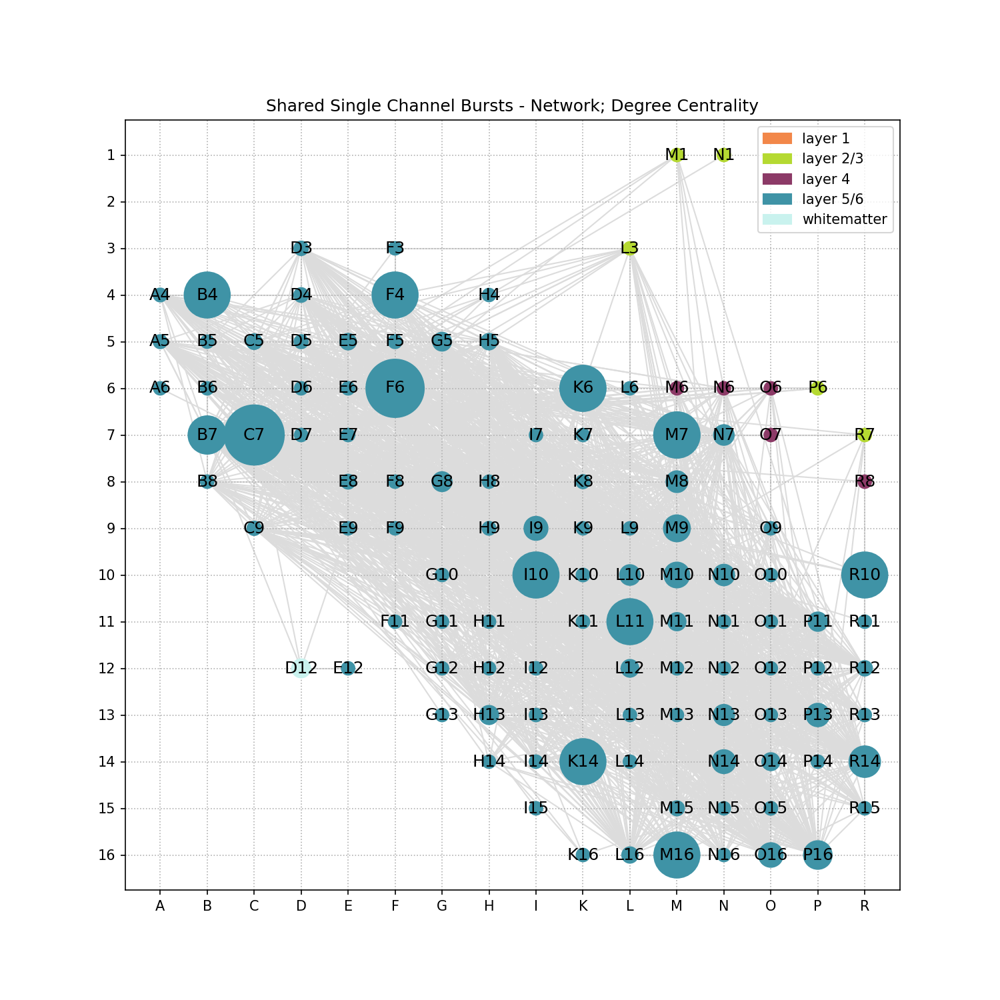

<ipython-input-226-8e0886b1c5d0>:50: UserWarning: Legend does not support '#F28749' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-226-8e0886b1c5d0>:50: UserWarning: Legend does not support '#B5D932' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-226-8e0886b1c5d0>:50: UserWarning: Legend does not support '#8C3A67' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-226-

In [226]:
# degree centrality

for i in H.nodes():
    node_key = i
    coordinate = mea_positional_coordinates_dic[node_key]
    H.nodes[node_key]['pos']=coordinate
    H.nodes[node_key]['layer']=inverted_layerdic[i]
    H.nodes[node_key]['color']=layer_colors[inverted_layerdic[i]]
    H.nodes[node_key]['degree_centrality']=nx.degree_centrality(G)[i]
    H.nodes[node_key]['bursting_time_normalized']=normalized_bursting_time_per_unit_dic[i]


pos = nx.get_node_attributes(H, 'pos')
layer = nx.get_node_attributes(H, 'layer')
color = nx.get_node_attributes(H, 'color')
bursting_time_normalized = nx.get_node_attributes(H, 'bursting_time_normalized')

# plot the figures
fig, ax = plt.subplots(1,1, figsize=(10,10))


nodes = H.nodes()
# colors = [mapping[H.nodes[n]['color']] for n in nodes]
node_size = [v * 10000 for v in centrality.values()]
#node_size = [v * 5000 for v in bursting_time_normalized.values()]


nx.draw_networkx(
    H,
    pos,
    node_size=node_size,
    node_color=color.values(),
    edge_color='gainsboro',
    ax=ax
)


ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-0.05, 1.05)
ax.set_xticks(mea_coordinates)
ax.set_yticks(mea_coordinates)
ax.set_xticklabels(columnlist)
ax.set_yticklabels([16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1])
ax.set_title('Shared Single Channel Bursts - Network; Degree Centrality')

ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

ax.grid(ls=':')
#plt.axis("off")
ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
layer1 = mpatches.Patch(color='#F28749', label='layer 1')
layer23 = mpatches.Patch(color='#B5D932', label='layer 2/3')
layer4 = mpatches.Patch(color='#8C3A67', label='layer 4')
layer56 = mpatches.Patch(color='#3F93A6', label='layer 5/6')
wm = mpatches.Patch(color='#C9F2EE', label='whitematter')
plt.legend(handles=[layer1, layer23, layer4, layer56, wm])

#plt.yticks(mea_coordinates, columnlist)
#plt.xticks(list(mea_coordinates), columnlist)
plt.show()

fig.savefig('190416_'+filename+'_betweenness_centrality_0p1Hz.png', dpi = 300, bbox_inches='tight', transparent=True)

<IPython.core.display.Javascript object>


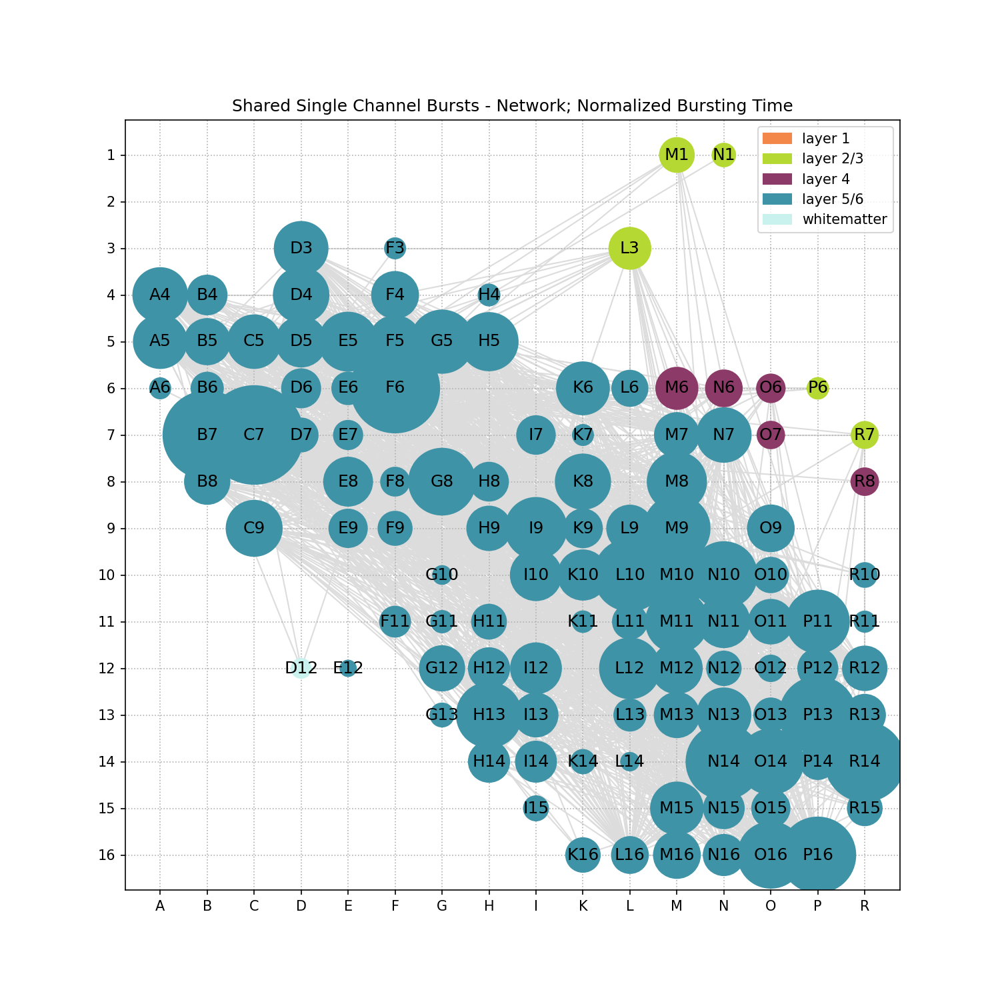

<ipython-input-227-1f9f3658067d>:50: UserWarning: Legend does not support '#F28749' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-227-1f9f3658067d>:50: UserWarning: Legend does not support '#B5D932' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-227-1f9f3658067d>:50: UserWarning: Legend does not support '#8C3A67' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-227-

In [227]:
# normalized bursting time

for i in H.nodes():
    node_key = i
    coordinate = mea_positional_coordinates_dic[node_key]
    H.nodes[node_key]['pos']=coordinate
    H.nodes[node_key]['layer']=inverted_layerdic[i]
    H.nodes[node_key]['color']=layer_colors[inverted_layerdic[i]]
    H.nodes[node_key]['degree_centrality']=nx.degree_centrality(G)[i]
    H.nodes[node_key]['bursting_time_normalized']=normalized_bursting_time_per_unit_dic[i]


pos = nx.get_node_attributes(H, 'pos')
layer = nx.get_node_attributes(H, 'layer')
color = nx.get_node_attributes(H, 'color')
bursting_time_normalized = nx.get_node_attributes(H, 'bursting_time_normalized')

# plot the figures
fig, ax = plt.subplots(1,1, figsize=(10,10))


nodes = H.nodes()
# colors = [mapping[H.nodes[n]['color']] for n in nodes]
#node_size = [v * 10000 for v in centrality.values()]
node_size = [v * 5000 for v in bursting_time_normalized.values()]


nx.draw_networkx(
    H,
    pos,
    node_size=node_size,
    node_color=color.values(),
    edge_color='gainsboro',
    ax=ax
)


ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-0.05, 1.05)
ax.set_xticks(mea_coordinates)
ax.set_yticks(mea_coordinates)
ax.set_xticklabels(columnlist)
ax.set_yticklabels([16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1])
ax.set_title('Shared Single Channel Bursts - Network; Normalized Bursting Time')

ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

ax.grid(ls=':')
#plt.axis("off")
ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
layer1 = mpatches.Patch(color='#F28749', label='layer 1')
layer23 = mpatches.Patch(color='#B5D932', label='layer 2/3')
layer4 = mpatches.Patch(color='#8C3A67', label='layer 4')
layer56 = mpatches.Patch(color='#3F93A6', label='layer 5/6')
wm = mpatches.Patch(color='#C9F2EE', label='whitematter')
plt.legend(handles=[layer1, layer23, layer4, layer56, wm])

#plt.yticks(mea_coordinates, columnlist)
#plt.xticks(list(mea_coordinates), columnlist)
plt.show()

fig.savefig('190416_'+filename+'_normalized_bursting_time_0p1Hz.png', dpi = 300, bbox_inches='tight', transparent=True)

### Network based on Binned Spiketrain Correlation:


In [47]:
# bin the spikedictionaries per channel or unit into bins, the recording time needs to be generalized
binsize = 10 # in miliseconds
scale_factor_for_milisecond = 1e-03
binned_spike_dictionary = {}


bins= np.arange(0, timelengthrecording_s*1000+binsize, binsize) # times 1000 to get the miliseconds
for key in st_channel:
    x = np.asarray(st_channel[key])*scale_factor_for_milisecond*tick
    binned_channel = np.histogram(x, bins)
    binned_spike_dictionary[key]  = binned_channel[0]

In [48]:
df = pd.DataFrame(data=binned_spike_dictionary)

In [49]:
correlated = df.corr(method='pearson')

<IPython.core.display.Javascript object>


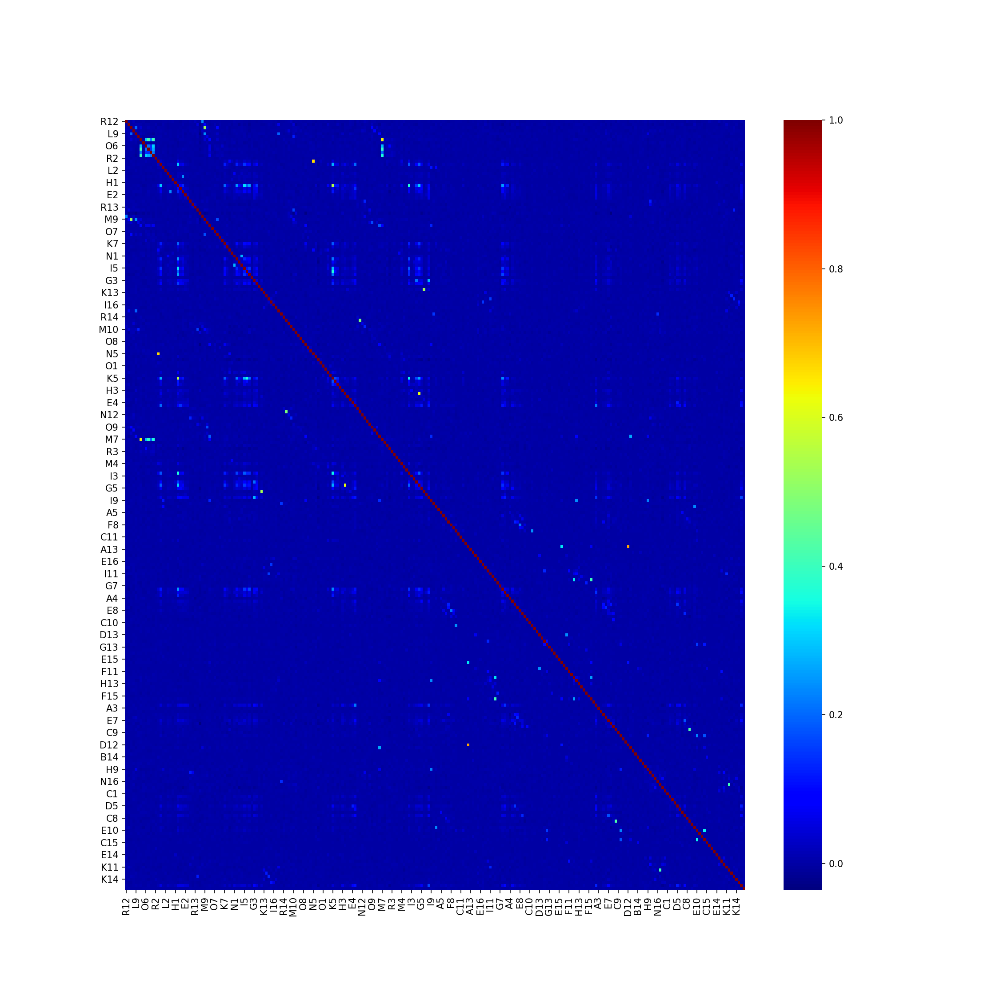

In [85]:
fig, ax = plt.subplots(1,1, figsize=(15,15))

sns.heatmap(correlated, ax=ax, cmap='jet')
fig.savefig(filename+'correlation_matrix_10ms_binned_spiketrains.png', dpi=300, bbox_inches='tight')

In [68]:
# get correlation coefficient for connection dictionary

correlation_dic = {}
correlation_threshold = 0.5

correlated_list = []

for i in all_channels:
    correlated_list = []
    for j in all_channels:
        if correlated[i][j] > correlation_threshold:
            if i != j:
                correlated_list.append(j)
    correlation_dic[i] = correlated_list

In [69]:
correlation_dic

{'D1': [],
 'E1': [],
 'F1': [],
 'G1': ['F2'],
 'H1': [],
 'I1': [],
 'I2': [],
 'K1': [],
 'K2': [],
 'L1': [],
 'L2': [],
 'L3': [],
 'M1': [],
 'M2': [],
 'M3': [],
 'M4': [],
 'N1': [],
 'N2': [],
 'N3': [],
 'N4': [],
 'N5': ['M5'],
 'N6': [],
 'O1': [],
 'O2': [],
 'O3': [],
 'O4': [],
 'O5': [],
 'O6': [],
 'O7': [],
 'P1': [],
 'P2': [],
 'P3': [],
 'P4': [],
 'P5': [],
 'P6': [],
 'P7': [],
 'P8': [],
 'P9': [],
 'R2': [],
 'R3': [],
 'R4': [],
 'R5': [],
 'R6': [],
 'R7': [],
 'R8': [],
 'R9': [],
 'R10': [],
 'R11': [],
 'R12': [],
 'R13': [],
 'R14': [],
 'R15': [],
 'B1': [],
 'B2': [],
 'C1': [],
 'C2': [],
 'D2': [],
 'E2': [],
 'F2': ['G1'],
 'G2': [],
 'G3': [],
 'H2': [],
 'H3': [],
 'I3': [],
 'K3': [],
 'K4': [],
 'L4': [],
 'L5': [],
 'M5': ['N5'],
 'M6': [],
 'M7': ['M8'],
 'N7': [],
 'N8': [],
 'O8': [],
 'O9': [],
 'O10': ['M9'],
 'O11': [],
 'P10': [],
 'P11': [],
 'P12': [],
 'P13': [],
 'P14': [],
 'P15': [],
 'P16': [],
 'A2': [],
 'A3': [],
 'A4': [],
 'A5

In [70]:
J = nx.Graph()

for key in correlation_dic:
    for i in correlation_dic[key]:
        J.add_edge(key, i)

In [71]:
J.nodes()

NodeView(('G1', 'F2', 'N5', 'M5', 'M7', 'M8', 'O10', 'M9', 'D12', 'E12', 'H7', 'I7', 'I6', 'K5'))

In [73]:
for i in J.nodes():
    node_key = i
    coordinate = mea_positional_coordinates_dic[node_key]
    J.nodes[node_key]['pos']=coordinate
    J.nodes[node_key]['layer']=inverted_layerdic[i]
    J.nodes[node_key]['color']=layer_colors[inverted_layerdic[i]]
    J.nodes[node_key]['degree_centrality']=nx.degree_centrality(J)[i]
    #J.nodes[node_key]['bursting_time_normalized']=normalized_bursting_time_per_unit_dic[i]

In [74]:
J.nodes

NodeView(('G1', 'F2', 'N5', 'M5', 'M7', 'M8', 'O10', 'M9', 'D12', 'E12', 'H7', 'I7', 'I6', 'K5'))

In [78]:
components = nx.connected_components(J)

# find the largest component
largest_component = max(components, key=len)

In [79]:
K = J.subgraph(largest_component)

In [81]:
centrality_J = nx.betweenness_centrality(J, k=10, endpoints = True)
#centrality_K = nx.betweenness_centrality(K, k=10, endpoints = True)

In [82]:
pos = nx.get_node_attributes(J, 'pos')
layer = nx.get_node_attributes(J, 'layer')
color = nx.get_node_attributes(J, 'color')
burst_time = nx.get_node_attributes(J, 'bursting_time_normalized')

<IPython.core.display.Javascript object>


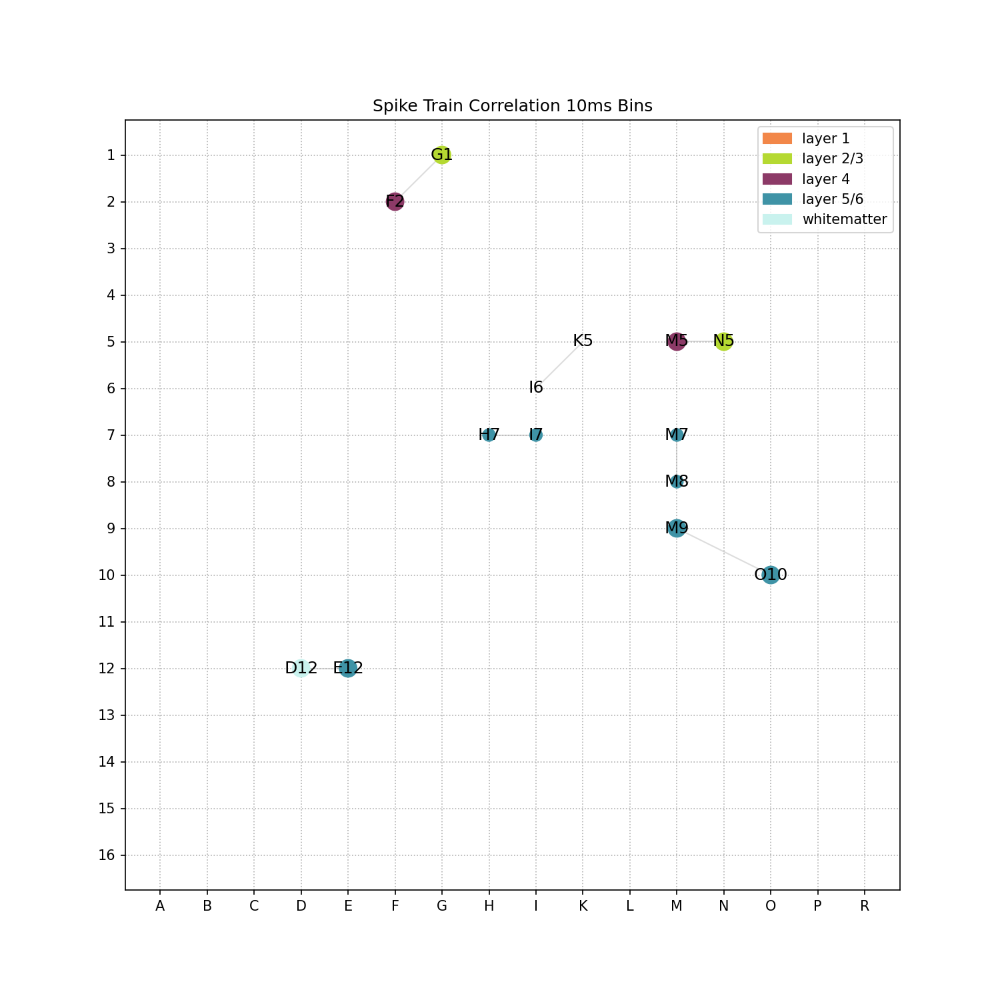

<ipython-input-84-bd5b2c7fa622>:50: UserWarning: Legend does not support '#F28749' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-84-bd5b2c7fa622>:50: UserWarning: Legend does not support '#B5D932' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-84-bd5b2c7fa622>:50: UserWarning: Legend does not support '#8C3A67' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-84-bd5b

In [84]:
# normalized bursting time

for i in J.nodes():
    node_key = i
    coordinate = mea_positional_coordinates_dic[node_key]
    J.nodes[node_key]['pos']=coordinate
    J.nodes[node_key]['layer']=inverted_layerdic[i]
    J.nodes[node_key]['color']=layer_colors[inverted_layerdic[i]]
    J.nodes[node_key]['degree_centrality']=nx.degree_centrality(J)[i]
    #J.nodes[node_key]['bursting_time_normalized']=normalized_bursting_time_per_unit_dic[i]


pos = nx.get_node_attributes(J, 'pos')
layer = nx.get_node_attributes(J, 'layer')
color = nx.get_node_attributes(J, 'color')


# plot the figures
fig, ax = plt.subplots(1,1, figsize=(10,10))


nodes = J.nodes()
# colors = [mapping[H.nodes[n]['color']] for n in nodes]
node_size = [v * 10000 for v in centrality_J.values()]
#node_size = [v * 5000 for v in bursting_time_normalized.values()]


nx.draw_networkx(
    J,
    pos,
    node_size=node_size,
    node_color=color.values(),
    edge_color='gainsboro',
    ax=ax
)


ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-0.05, 1.05)
ax.set_xticks(mea_coordinates)
ax.set_yticks(mea_coordinates)
ax.set_xticklabels(columnlist)
ax.set_yticklabels([16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1])
ax.set_title('Spike Train Correlation 10ms Bins')

ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

ax.grid(ls=':')
#plt.axis("off")
ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
layer1 = mpatches.Patch(color='#F28749', label='layer 1')
layer23 = mpatches.Patch(color='#B5D932', label='layer 2/3')
layer4 = mpatches.Patch(color='#8C3A67', label='layer 4')
layer56 = mpatches.Patch(color='#3F93A6', label='layer 5/6')
wm = mpatches.Patch(color='#C9F2EE', label='whitematter')
plt.legend(handles=[layer1, layer23, layer4, layer56, wm])

#plt.yticks(mea_coordinates, columnlist)
#plt.xticks(list(mea_coordinates), columnlist)
plt.show()

fig.savefig('190416_'+filename+'_spiketrain_correlation.png', dpi = 300, bbox_inches='tight', transparent=True)